In [9]:
import numpy as np
import pandas as pd
import scipy
import scipy.sparse
import scanpy as sc
import scvelo as scv
import anndata
import seaborn as sns
import palantir
import os

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.font_manager as fm
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.lines import Line2D
import matplotlib.cm as cm
import plotly.graph_objects as go
import networkx as nx

from adjustText import adjust_text
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform
from fa2_modified import ForceAtlas2

import cellrank as cr
from moscot.problems.time import TemporalProblem
from cellrank.kernels import RealTimeKernel, PseudotimeKernel
from cellmapper import CellMapper


In [10]:
# SETTINGS
sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 1
sc.logging.print_version_and_date()
print(matplotlib.__version__)

FIGSIZE_SINGLE = (6, 6)
FIGSIZE_WIDE = (9, 6)
plt.rcParams["figure.figsize"] = list(FIGSIZE_SINGLE)

for name, cols in [
    ("custom_wbr",  ["#FFFFFF", "#006199", "#DA4948"]),
    ("custom_gbr",  ["#808080", "#006199", "#DA4948"]),   
    ("custom_bbyr", ["#0c0d0c", "#006199", "#EED365", "#DA4948"]),
    ("custom_br",   ["#006199", "#DA4948"]),
    ("custom_btr",  ["#006199", "#70c269", "#DA4948"]),
    ("custom_btry", ["#006199", "#70c269", "#EED365", "#DA4948"]),
]:
    cmap = LinearSegmentedColormap.from_list(name, cols)
    plt.colormaps.register(name=name, cmap=cmap)

font_path = "/home/uvictor/BAHNSCHRIFT.TTF"
fm.fontManager.addfont(font_path)
fm._load_fontmanager(try_read_cache=False)
plt.rcParams["font.family"] = "bahnschrift"
matplotlib.rcParams["axes.unicode_minus"] = False


Running Scanpy 1.12.1, on 2026-05-06 23:30.
3.10.9


ValueError: A colormap named "custom_wbr" is already registered.

In [11]:
path = "/home/uvictor/ubels26_hair_cycle/"
print(os.listdir(path))

output_dir = (os.path.join(path, "cellrank/follicle/"))
os.makedirs(output_dir, exist_ok=True)


['scatac_files', '.gitattributes', '.git', 'marker_genes', 'cell_communication_results', 'cellrank', 'plots', 'annotated_vis_obj.rds', 'preprocessing', 'renv.lock', 'enrichment_plots', 'velocity_output', '.Rhistory', 'post_filter_nonintegrated_objects.RDS', 'obj_anndata.h5ad', 'umap_hierarchical.svg', 'post_filter_integrated_objects.RDS', 'Spatial_scalp_S2_final.rds', 'renv', 'annotated_obj.rds', 'ubels26_hair_cycle.Rproj', '.Rproj.user', '.gitignore', '.Rprofile', 'broad_annotated_obj.rds', 'scripts', 'spatial_trajectory', 'object_list.RDS']


In [12]:
adata = anndata.read_h5ad(os.path.join(path, 'obj_anndata.h5ad'))


In [13]:
adata

AnnData object with n_obs × n_vars = 18659 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'scDblFinder.score', 'percent.ribo', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'CC.Difference', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.1', 'SCT_snn_res.0.3', 'SCT_snn_res.0.6', 'SCT_snn_res.0.7', 'SCT_snn_res.0.9', 'seurat_clusters', 'SCT_snn_res.0.2', 'SCT_snn_res.0.4', 'SCT_snn_res.0.5', 'SCT_snn_res.0.8', 'broad_cluster', 'fine_clust', 'mapping_cell_type', 'plotting_cell_type'
    var: 'names'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts_RNA'

In [71]:
def _style_embedding_ax(ax, title, title_fontsize=25, label_fontsize=15):
    ax.axis("on")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_title(title, fontsize=title_fontsize)
    ax.set_xlabel("t-SNE 1", fontsize=label_fontsize)
    ax.set_ylabel("t-SNE 2", fontsize=label_fontsize)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    ax.set_xticks([])
    ax.set_yticks([])
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    arrow_props = dict(head_width=3, head_length=1.5, fc="k", ec="k")
    ax.arrow(xmin, ymin, (xmax - xmin) / 4, 0, **arrow_props)
    ax.arrow(xmin, ymin, 0, (ymax - ymin) / 4, **arrow_props)


def plot_tsne_with_labels(adata, color_var, plot_title, legend_fontsize=20, figsize=FIGSIZE_SINGLE):
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        ax = sc.pl.tsne(adata, color=[color_var], show=False, frameon=True)
        ax.get_legend().remove()
        _style_embedding_ax(ax, plot_title)
        texts = []
        for group in adata.obs[color_var].unique():
            mask = adata.obs[color_var] == group
            x = adata.obsm["X_tsne"][mask, 0].mean()
            y = adata.obsm["X_tsne"][mask, 1].mean()
            text = ax.text(
                x, y, str(group),
                fontsize=legend_fontsize,
                path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                ha="center", va="center",
            )
            texts.append(text)
        adjust_text(
            texts,
            expand_points=(1.2, 1.2),
            force_points=(0.5, 0.5),
            arrowprops=dict(arrowstyle="-", color="black", lw=0.5),
        )
        return ax


def plot_paga_on_tsne(adata, color_var="fine_clust", plot_title="PAGA overlay on t-SNE",
                      figsize=FIGSIZE_SINGLE, legend_fontsize=18, save_fig=False):
    if "paga" not in adata.uns:
        raise ValueError("Run sc.tl.paga() first.")
    if "X_tsne" not in adata.obsm:
        raise ValueError("Run sc.tl.tsne() first.")
    fig, ax = plt.subplots(figsize=figsize)
    sc.pl.tsne(adata, color=color_var, size=50, alpha=0.5,
               show=False, title="", ax=ax, legend_loc=None)
    pos = np.zeros((len(adata.obs[color_var].cat.categories), 2))
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        mask = adata.obs[color_var] == cat
        pos[i] = np.mean(adata.obsm["X_tsne"][mask], axis=0)
    connectivities = adata.uns["paga"]["connectivities"].tocsr()
    for i in range(connectivities.shape[0]):
        for j in range(connectivities.shape[1]):
            if connectivities[i, j] > 0:
                ax.plot(
                    [pos[i, 0], pos[j, 0]],
                    [pos[i, 1], pos[j, 1]],
                    "-", color="black",
                    linewidth=connectivities[i, j] * 6,
                    alpha=0.5,
                )
    ax.scatter(pos[:, 0], pos[:, 1], s=200, c="white", edgecolor="black", zorder=3)
    _style_embedding_ax(ax, plot_title, title_fontsize=25)
    ax.set_title(plot_title, fontsize=25, pad=15)
    center = np.mean(pos, axis=0)
    texts = []
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        vec = np.array([pos[i, 0] - center[0], pos[i, 1] - center[1]])
        offset_distance = 18
        if np.any(vec):
            vec = vec / np.sqrt(np.sum(vec**2)) * offset_distance
        text = ax.text(
            pos[i, 0] + vec[0], pos[i, 1] + vec[1], str(cat),
            fontsize=legend_fontsize,
            path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
            ha="center", va="center",
        )
        texts.append(text)
    if save_fig:
        plt.savefig("PAGA_on_TSNE.png", bbox_inches="tight")
    return ax


def plot_embedding_pseudotime(adata, color_var, plot_title, figsize=FIGSIZE_SINGLE):
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        ax = sc.pl.embedding(
            adata, color=color_var, basis="X_tsne",
            show=False, frameon=True, cmap="custom_btry", title=plot_title,
        )
        _style_embedding_ax(ax, plot_title)
        return ax


def plot_random_walk_tsne(tmk_obj, plot_title, figsize=FIGSIZE_SINGLE):
    tmk_obj.plot_random_walks(
        max_iter=20, n_sims=5000,
        start_ixs={"hair_cycle_numeric": 0.0},
        basis="tsne", seed=0, figsize=figsize,
        frameon=True, cmap="custom_wbr",
    )
    ax = plt.gca()
    _style_embedding_ax(ax, plot_title)
    return ax


def plot_macrostates_tsne(adata, estimator, plot_title, figsize=FIGSIZE_SINGLE):
    estimator.plot_macrostates(which="all", discrete=False, basis="tsne", show=False)
    adata.obs["macrostates"] = estimator.macrostates.copy()
    ax = plt.gca()
    _style_embedding_ax(ax, plot_title)
    return ax


def filter_genes(adata, blacklist_patterns=["MT-", "RPL", "RPS"]):
    gene_names = adata.var_names.str.upper()
    keep_genes = np.ones(len(gene_names), dtype=bool)
    for pattern in blacklist_patterns:
        keep_genes &= ~gene_names.str.startswith(pattern.upper())
    return keep_genes


def calculate_gene_expression_similarity(adata, clusters, n_top_genes=1000):
    adata_f = adata.copy()
    adata_f = adata_f[:, filter_genes(adata_f)]
    if "highly_variable" not in adata_f.var:
        sc.pp.highly_variable_genes(adata_f, n_top_genes=n_top_genes, flavor="seurat")
    top_genes = adata_f.var_names[adata_f.var.highly_variable][:n_top_genes].tolist()
    cluster_means = {}
    for cl in clusters:
        cells = adata_f[adata_f.obs["fine_clust"] == cl]
        mean_expr = cells[:, top_genes].X.mean(axis=0)
        if scipy.sparse.issparse(mean_expr):
            mean_expr = mean_expr.A.flatten()
        cluster_means[cl] = np.asarray(mean_expr).flatten()
    expr_mat = np.vstack([cluster_means[cl] for cl in clusters])
    corr = np.corrcoef(expr_mat)
    sim = (corr + 1) / 2
    sim_df = pd.DataFrame(sim, index=clusters, columns=clusters)
    return sim_df, top_genes


def plot_expression_similarity_heatmap(similarity_df, figsize=(12, 10), vmin=0.7, vmax=1.0):
    g = sns.clustermap(
        similarity_df, annot=True, fmt=".2f", cmap="custom_wbr",
        square=True, vmin=vmin, vmax=vmax,
        dendrogram_ratio=0.1, tree_kws={"linewidth": 2},
        row_colors=None, colors_ratio=0,
    )
    g.cax.set_visible(False)
    g.fig.suptitle(
        "Cluster Expression Similarity Heatmap\n"
        "(Based on Top 1000 Variable Genes\n"
        "Excluding MT-, RPL, and RPS genes)",
        y=1.02, fontsize=20,
    )
    plt.tight_layout()
    return g.fig


def analyze_cluster_genes(adata, clusters, n_genes_display=10):
    adata_f = adata[:, filter_genes(adata)].copy()
    results = []
    for cluster in clusters:
        sc.tl.rank_genes_groups(
            adata_f, groupby="fine_clust",
            groups=[cluster], reference="rest", method="wilcoxon",
        )
        top = sc.get.rank_genes_groups_df(adata_f, group=cluster).head(n_genes_display)
        results.append({
            "cluster": cluster,
            "top_genes": top["names"].tolist(),
            "scores": top["scores"].tolist(),
            "log2fc": top["logfoldchanges"].tolist(),
        })
    return results


def create_custom_trajectory(adata, cluster_order, cluster_col="macrostates",
                             basis="X_tsne", sigma=0.1):
    if basis not in adata.obsm:
        raise KeyError(f"'{basis}' not found in adata.obsm. Available: {list(adata.obsm.keys())}")
    ordered_clusters = [k for k, v in sorted(cluster_order.items(), key=lambda x: x[1])]
    coords = adata.obsm[basis]
    centroids = {}
    for cl in ordered_clusters:
        mask = adata.obs[cluster_col] == cl
        if mask.any():
            centroids[cl] = coords[mask].mean(axis=0)
    ordered_centroids = np.vstack([centroids[cl] for cl in ordered_clusters])
    centroid_dists = np.cumsum([0] + [
        np.linalg.norm(ordered_centroids[i] - ordered_centroids[i - 1])
        for i in range(1, len(ordered_centroids))
    ])
    centroid_positions = centroid_dists / centroid_dists[-1]

    def _point_to_segment(point, start, end):
        seg = end - start
        length_sq = np.sum(seg**2)
        if length_sq == 0:
            return np.linalg.norm(point - start), 0.0, start
        t = max(0, min(1, np.sum((point - start) * seg) / length_sq))
        proj = start + t * seg
        return np.linalg.norm(point - proj), t, proj

    pseudotime = np.zeros(len(adata))
    for i in range(len(coords)):
        min_dist = float("inf")
        best_time = 0
        for j in range(len(ordered_centroids) - 1):
            dist, t, _ = _point_to_segment(coords[i], ordered_centroids[j], ordered_centroids[j + 1])
            if dist < min_dist:
                min_dist = dist
                best_time = centroid_positions[j] * (1 - t) + centroid_positions[j + 1] * t
        pseudotime[i] = best_time
    adata.obs["trajectory_order"] = adata.obs[cluster_col].map(cluster_order)
    adata.obs["custom_pseudotime"] = pseudotime
    adata.uns["trajectory_centroids"] = {
        "coordinates": ordered_centroids,
        "pseudotime": centroid_positions,
    }
    return adata


# ══════════════════════════════════════════════════════════════════════════════
# GENE CHAIN INTERNALS — basis parameter on all functions
# ══════════════════════════════════════════════════════════════════════════════

def get_gene_peak_position(adata, gene, pseudotime_key, basis="X_tsne", top_frac=0.15):
    gene_idx = list(adata.var_names).index(gene)
    if "MAGIC_imputed_data" in adata.layers:
        x = adata.layers["MAGIC_imputed_data"][:, gene_idx]
    else:
        x = adata.X[:, gene_idx]
    if scipy.sparse.issparse(x):
        expr = np.asarray(x.todense()).flatten()
    else:
        expr = np.asarray(x).flatten()
    pt = adata.obs[pseudotime_key].values
    valid = ~np.isnan(pt) & (expr > 0)
    expr = expr[valid]
    pt = pt[valid]
    coords = adata.obsm[basis][valid]
    if len(expr) == 0 or expr.sum() == 0:
        return None
    n_top = max(10, int(len(expr) * top_frac))
    top_idx = np.argsort(expr)[-n_top:]
    expr_top = expr[top_idx]
    pt_top = pt[top_idx]
    coords_top = coords[top_idx]
    weights = expr_top / expr_top.sum()
    peak_pt = np.average(pt_top, weights=weights)
    centroid_x = np.average(coords_top[:, 0], weights=weights)
    centroid_y = np.average(coords_top[:, 1], weights=weights)
    return {"gene": gene, "peak_pt": peak_pt, "x": centroid_x, "y": centroid_y}


def _collect_genes(adata, macrostate_drivers, ordered_states, pseudotime_key,
                   custom_genes, seen_genes, n_genes_per_state, top_frac,
                   blacklist_prefixes, interpolate_fn, basis="X_tsne"):
    gene_positions = []
    for state in ordered_states:
        if state not in macrostate_drivers:
            continue
        count = 0
        for gene in macrostate_drivers[state]:
            if gene in seen_genes:
                continue
            if any(gene.startswith(p) for p in blacklist_prefixes):
                continue
            if gene not in adata.var_names:
                continue
            peak = get_gene_peak_position(adata, gene, pseudotime_key,
                                          basis=basis, top_frac=top_frac)
            if peak is None:
                continue
            xy = interpolate_fn(peak["peak_pt"])
            gene_positions.append({
                "gene": gene, "peak_pt": peak["peak_pt"],
                "x": xy[0], "y": xy[1],
            })
            seen_genes.add(gene)
            count += 1
            if count >= n_genes_per_state:
                break
    if custom_genes:
        for gene in custom_genes:
            if gene in seen_genes:
                continue
            if gene not in adata.var_names:
                print(f"  Skipping {gene} — not in var_names")
                continue
            peak = get_gene_peak_position(adata, gene, pseudotime_key,
                                          basis=basis, top_frac=top_frac)
            if peak is None:
                print(f"  Skipping {gene} — no expression")
                continue
            xy = interpolate_fn(peak["peak_pt"])
            gene_positions.append({
                "gene": gene, "peak_pt": peak["peak_pt"],
                "x": xy[0], "y": xy[1],
            })
            seen_genes.add(gene)
    return gene_positions


def _build_spine(adata, ordered_states, pseudotime_key, macrostate_col, basis="X_tsne"):
    centroids, state_mean_pt = {}, {}
    for state in ordered_states:
        mask = adata.obs[macrostate_col] == state
        if not mask.any():
            continue
        centroids[state] = adata[mask].obsm[basis].mean(axis=0)
        pt_vals = adata.obs.loc[mask, pseudotime_key].dropna()
        if len(pt_vals) > 0:
            state_mean_pt[state] = pt_vals.mean()
    spine_states = [s for s in ordered_states if s in centroids and s in state_mean_pt]
    if not spine_states:
        return None, None, None
    spine_coords = np.array([centroids[s] for s in spine_states])
    spine_pts = np.array([state_mean_pt[s] for s in spine_states])
    sort_idx = np.argsort(spine_pts)
    spine_coords = spine_coords[sort_idx]
    spine_pts = spine_pts[sort_idx]
    spine_states = [spine_states[i] for i in sort_idx]
    return spine_coords, spine_pts, spine_states


def _make_interpolator(spine_coords, spine_pts):
    def interpolate(pt_val):
        if pt_val <= spine_pts[0]:
            return spine_coords[0]
        if pt_val >= spine_pts[-1]:
            return spine_coords[-1]
        idx = np.searchsorted(spine_pts, pt_val) - 1
        idx = max(0, min(idx, len(spine_pts) - 2))
        t = (pt_val - spine_pts[idx]) / (spine_pts[idx + 1] - spine_pts[idx] + 1e-12)
        return spine_coords[idx] * (1 - t) + spine_coords[idx + 1] * t
    return interpolate


def _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=False):
    n = len(spine_coords)
    loop_range = n if close_loop else n - 1
    for i in range(loop_range):
        p0 = spine_coords[i]
        p1 = spine_coords[(i + 1) % n]
        ax.annotate(
            "", xy=(p1[0], p1[1]), xytext=(p0[0], p0[1]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=5, mutation_scale=28, alpha=0.3),
            zorder=3,
        )
    for i, state in enumerate(spine_states_sorted):
        cx, cy = spine_coords[i]
        ax.scatter(cx, cy, s=120, c="white", edgecolors=trajectory_color,
                   linewidths=2, zorder=5, alpha=0.8)
        ax.text(
            cx, cy - 3, state,
            fontsize=5, fontstyle="italic", color="gray",
            ha="center", va="top",
            path_effects=[pe.withStroke(linewidth=2, foreground="white")],
            zorder=7,
        )


def _draw_genes(gene_positions, trajectory_color, ax, close_loop=False):
    for i in range(len(gene_positions) - 1):
        gp0, gp1 = gene_positions[i], gene_positions[i + 1]
        ax.annotate(
            "", xy=(gp1["x"], gp1["y"]),
            xytext=(gp0["x"], gp0["y"]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=2.5, mutation_scale=16, alpha=0.6),
            zorder=4,
        )
    if close_loop and len(gene_positions) >= 2:
        ax.annotate(
            "", xy=(gene_positions[0]["x"], gene_positions[0]["y"]),
            xytext=(gene_positions[-1]["x"], gene_positions[-1]["y"]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=2.5, mutation_scale=16, alpha=0.4,
                            linestyle="dashed"),
            zorder=4,
        )
    texts = []
    for gp in gene_positions:
        ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
                   edgecolors="black", linewidths=1.2, zorder=6, marker="o")
        text = ax.text(
            gp["x"], gp["y"], gp["gene"],
            fontsize=9, fontweight="bold",
            ha="center", va="bottom",
            path_effects=[pe.withStroke(linewidth=3, foreground="white")],
            zorder=8,
        )
        texts.append(text)
    adjust_text(
        texts,
        expand_points=(1.8, 1.8),
        force_points=(1.0, 1.0),
        arrowprops=dict(arrowstyle="-", color="gray", lw=0.5),
    )


# ══════════════════════════════════════════════════════════════════════════════
# TOPOLOGY — coarse_T graph + hierarchical decomposition
# ══════════════════════════════════════════════════════════════════════════════

def build_macrostate_graph_from_coarse_T(estimator, threshold=0.0):
    coarse_T = estimator.coarse_T
    macrostates = coarse_T.index.tolist()
    G = nx.DiGraph()
    G.add_nodes_from(macrostates)
    for src in macrostates:
        for tgt in macrostates:
            if src == tgt:
                continue
            w = float(coarse_T.loc[src, tgt])
            if w > threshold:
                G.add_edge(src, tgt, weight=w)
                G[src][tgt]["inv_weight"] = 1.0 / (w + 1e-9)
    return G


def get_paths_to_terminals(G, initial_state, terminal_states):
    paths = {}
    for terminal in terminal_states:
        try:
            path = nx.shortest_path(
                G, source=initial_state, target=terminal, weight="inv_weight"
            )
            paths[terminal] = path
        except (nx.NetworkXNoPath, nx.NodeNotFound) as e:
            print(f"  WARNING: No path to {terminal}: {e}")
    return paths


def find_divergence_point(paths):
    if not paths:
        return None
    path_lists = list(paths.values())
    shared = set(path_lists[0])
    for p in path_lists[1:]:
        shared &= set(p)
    for state in reversed(path_lists[0]):
        if state in shared:
            return state
    return None


def derive_topology(estimator, initial_state, terminal_states, threshold=0.0):
    G = build_macrostate_graph_from_coarse_T(estimator, threshold=threshold)
    print(f"\nMacrostate graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")
    print("\nTop 20 edges by transition probability:")
    sorted_edges = sorted(G.edges(data=True), key=lambda x: -x[2]["weight"])
    for src, tgt, d in sorted_edges[:20]:
        print(f"  {src} -> {tgt}  ({d['weight']:.4f})")
    paths = get_paths_to_terminals(G, initial_state, terminal_states)
    if not paths:
        reachable = set(nx.descendants(G, initial_state)) if initial_state in G else set()
        print(f"\n  Reachable from {initial_state}: {reachable}")
        print(f"  Terminal states requested: {terminal_states}")
        raise ValueError("No paths found.")
    branch_point = find_divergence_point(paths)
    reference_path = next(iter(paths.values()))
    if branch_point not in reference_path:
        raise ValueError(f"Branch point '{branch_point}' not in reference path.")
    branch_idx = reference_path.index(branch_point) + 1
    trunk_states = reference_path[:branch_idx]
    lineage_arms = {
        terminal: path[branch_idx:]
        for terminal, path in paths.items()
    }
    print(f"\nDivergence point: {branch_point}")
    print(f"Trunk: {' -> '.join(trunk_states)}")
    for arm, states in lineage_arms.items():
        print(f"  Arm {arm}: {' -> '.join(states) if states else '(direct terminal)'}")
    return trunk_states, lineage_arms, branch_point


def _decompose_tree(paths_dict, connect_from=None):
    if not paths_dict:
        return []
    if len(paths_dict) == 1:
        terminal, path = next(iter(paths_dict.items()))
        full = ([connect_from] + path) if connect_from else path
        return [{"states": full, "terminals": {terminal}}]
    path_lists = list(paths_dict.values())
    min_len = min(len(p) for p in path_lists)
    prefix_len = 0
    for i in range(min_len):
        if len({p[i] for p in path_lists}) == 1:
            prefix_len = i + 1
        else:
            break
    prefix = path_lists[0][:prefix_len]
    all_terminals = set(paths_dict.keys())
    segments = []
    full_prefix = ([connect_from] + prefix) if connect_from else prefix
    if full_prefix:
        segments.append({"states": full_prefix, "terminals": all_terminals})
    child_connect = prefix[-1] if prefix else connect_from
    groups = {}
    for terminal, path in paths_dict.items():
        suffix = path[prefix_len:]
        if not suffix:
            continue
        key = suffix[0]
        if key not in groups:
            groups[key] = {}
        groups[key][terminal] = suffix
    for key, sub_paths in groups.items():
        segments.extend(_decompose_tree(sub_paths, connect_from=child_connect))
    return segments


def derive_hierarchical_topology(
    estimator, adata, initial_state, terminal_states,
    pseudotime_key="palantir_pseudotime",
    macrostate_col="macrostates_fwd",
    threshold=0.001,
    max_pt_jump=0.15,
    pt_slack=0.01,
):
    """
    Pseudotime-constrained hierarchical topology derivation.

    Two constraints prune the coarse_T graph before path-finding:

    1. Forward-only: edges where target_pt < source_pt - pt_slack are removed.
       This prevents backward routing through earlier states.

    2. Max jump distance: edges where (target_pt - source_pt) > max_pt_jump
       are removed. This eliminates skip connections and forces paths through
       intermediate macrostates.

    Parameters
    ----------
    max_pt_jump : float
        Maximum allowed pseudotime gap per edge. With 19 macrostates spanning
        [0, 1], typical values are 0.12–0.20. Lower values force more
        intermediate steps; higher values allow longer jumps.
    pt_slack : float
        Small tolerance for the forward-only constraint. Allows edges between
        macrostates at nearly equal pseudotime (e.g., co-occurring states).
    """
    coarse_T = estimator.coarse_T
    macrostates = coarse_T.index.tolist()

    # ── Compute mean pseudotime per macrostate ──
    mean_pt = {}
    for state in macrostates:
        mask = adata.obs[macrostate_col] == state
        if mask.any():
            pt_vals = adata.obs.loc[mask, pseudotime_key].dropna()
            if len(pt_vals) > 0:
                mean_pt[state] = pt_vals.mean()

    print("Mean pseudotime per macrostate:")
    for state in sorted(mean_pt, key=mean_pt.get):
        print(f"  {state:25s}  pt = {mean_pt[state]:.4f}")

    # ── Build constrained graph ──
    G = nx.DiGraph()
    G.add_nodes_from(macrostates)

    n_candidate = 0
    n_kept = 0
    n_backward = 0
    n_too_far = 0

    for src in macrostates:
        for tgt in macrostates:
            if src == tgt:
                continue
            w = float(coarse_T.loc[src, tgt])
            if w <= threshold:
                continue
            n_candidate += 1

            src_pt = mean_pt.get(src)
            tgt_pt = mean_pt.get(tgt)

            if src_pt is not None and tgt_pt is not None:
                # Constraint 1: forward-only
                if tgt_pt < src_pt - pt_slack:
                    n_backward += 1
                    continue
                # Constraint 2: maximum jump distance
                if (tgt_pt - src_pt) > max_pt_jump:
                    n_too_far += 1
                    continue

            n_kept += 1
            G.add_edge(src, tgt, weight=w)
            G[src][tgt]["inv_weight"] = -np.log(w + 1e-12)

    print(f"\nEdge filtering: {n_candidate} above threshold")
    print(f"  Removed (backward):  {n_backward}")
    print(f"  Removed (too far):   {n_too_far}")
    print(f"  Kept:                {n_kept}")

    # ── Print kept edges for inspection ──
    sorted_edges = sorted(G.edges(data=True), key=lambda x: -x[2]["weight"])
    print(f"\nTop edges in constrained graph:")
    for src, tgt, d in sorted_edges[:15]:
        gap = mean_pt.get(tgt, 0) - mean_pt.get(src, 0)
        print(f"  {src:20s} → {tgt:20s}  w={d['weight']:.4f}  Δpt={gap:+.3f}")

    # ── Find paths (excluding other terminals) ──
    paths = {}
    for terminal in terminal_states:
        other_terminals = [t for t in terminal_states if t != terminal]
        G_pruned = G.copy()
        for t in other_terminals:
            if t in G_pruned:
                G_pruned.remove_node(t)

        try:
            path = nx.shortest_path(
                G_pruned, initial_state, terminal, weight="inv_weight"
            )
            paths[terminal] = path
        except (nx.NetworkXNoPath, nx.NodeNotFound):
            print(f"  WARNING: No path to {terminal} in constrained graph, "
                  f"trying full constrained graph...")
            try:
                path = nx.shortest_path(
                    G, initial_state, terminal, weight="inv_weight"
                )
                paths[terminal] = path
                print(f"    Fallback succeeded (path may pass through another terminal)")
            except (nx.NetworkXNoPath, nx.NodeNotFound) as e:
                print(f"    No path at all: {e}")

    if not paths:
        raise ValueError(
            "No paths found. Try increasing max_pt_jump or decreasing threshold."
        )

    # ── Decompose into hierarchical segments ──
    segments = _decompose_tree(paths)

    print(f"\nHierarchical topology ({len(segments)} segments):")
    for seg in segments:
        n = len(seg["terminals"])
        if n == len(paths):
            label = "TRUNK (all)"
        elif n > 1:
            label = f"sub-trunk ({', '.join(sorted(seg['terminals']))})"
        else:
            label = next(iter(seg["terminals"]))
        print(f"  {' → '.join(seg['states'])}  [{label}]")

    # ── Path overlap diagnostic ──
    print(f"\nPath overlap matrix:")
    names = sorted(paths.keys())
    for i, a in enumerate(names):
        for b in names[i + 1:]:
            shared = set(paths[a]) & set(paths[b]) - {initial_state}
            if shared:
                ordered = sorted(shared, key=lambda s: mean_pt.get(s, 0))
                print(f"  {a} ∩ {b}: {ordered}")

    # ── Path lengths diagnostic ──
    print(f"\nPath lengths:")
    for terminal, path in sorted(paths.items()):
        print(f"  {terminal}: {len(path)} states  ({' → '.join(path)})")

    return segments, paths


def plot_cyclic_gene_chain(adata, macrostate_drivers, trajectory_order,
                           trajectory_color, ax, pseudotime_key,
                           custom_genes=None,
                           macrostate_col="macrostates",
                           basis="X_tsne",
                           n_genes_per_state=3, top_frac=0.15,
                           blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0")):
    ordered_states = [k for k, v in sorted(trajectory_order.items(), key=lambda x: x[1])]
    spine_coords, spine_pts, spine_states_sorted = _build_spine(
        adata, ordered_states, pseudotime_key, macrostate_col, basis=basis
    )
    if spine_coords is None:
        return []
    n_spine = len(spine_coords)
    seg_lengths = np.array([
        np.linalg.norm(spine_coords[(i + 1) % n_spine] - spine_coords[i])
        for i in range(n_spine)
    ])
    total_length = seg_lengths.sum()
    cum_arc = np.cumsum(np.concatenate([[0], seg_lengths[:-1]]))
    pt_min, pt_max = spine_pts[0], spine_pts[-1]
    pt_range = pt_max - pt_min if pt_max > pt_min else 1.0

    def interpolate_on_loop(pt_val):
        frac = np.clip((pt_val - pt_min) / pt_range, 0, 1) * (1 - 1e-6)
        arc_target = frac * total_length
        for i in range(n_spine):
            seg_end = cum_arc[i] + seg_lengths[i]
            if arc_target <= seg_end or i == n_spine - 1:
                t = np.clip((arc_target - cum_arc[i]) / (seg_lengths[i] + 1e-12), 0, 1)
                return spine_coords[i] * (1 - t) + spine_coords[(i + 1) % n_spine] * t
        return spine_coords[0]

    _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=True)
    seen = set()
    gene_positions = _collect_genes(
        adata, macrostate_drivers, spine_states_sorted, pseudotime_key,
        custom_genes, seen, n_genes_per_state, top_frac,
        blacklist_prefixes, interpolate_on_loop, basis=basis,
    )
    gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])
    _draw_genes(gene_positions, trajectory_color, ax, close_loop=True)
    return gene_positions


def plot_linear_gene_chain(adata, macrostate_drivers, trajectory_order,
                           trajectory_color, ax, pseudotime_key,
                           custom_genes=None,
                           macrostate_col="macrostates",
                           basis="X_tsne",
                           n_genes_per_state=3, top_frac=0.15,
                           blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0")):
    ordered_states = [k for k, v in sorted(trajectory_order.items(), key=lambda x: x[1])]
    spine_coords, spine_pts, spine_states_sorted = _build_spine(
        adata, ordered_states, pseudotime_key, macrostate_col, basis=basis
    )
    if spine_coords is None:
        return []
    interpolate_fn = _make_interpolator(spine_coords, spine_pts)
    _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=False)
    seen = set()
    gene_positions = _collect_genes(
        adata, macrostate_drivers, spine_states_sorted, pseudotime_key,
        custom_genes, seen, n_genes_per_state, top_frac,
        blacklist_prefixes, interpolate_fn, basis=basis,
    )
    gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])
    _draw_genes(gene_positions, trajectory_color, ax, close_loop=False)
    return gene_positions


def plot_fanout_gene_chain(
    adata, macrostate_drivers, trunk_states, lineage_arms, arm_colors,
    ax, pseudotime_key,
    trunk_color="#444444",
    custom_genes=None,
    n_genes_per_state=3, top_frac=0.15,
    macrostate_col="macrostates_fwd",
    basis="X_tsne",
    blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0"),
):
    trunk_coords, trunk_pts, trunk_states_sorted = _build_spine(
        adata, trunk_states, pseudotime_key, macrostate_col, basis=basis
    )
    if trunk_coords is not None:
        _draw_spine(trunk_coords, trunk_states_sorted, trunk_color, ax, close_loop=False)
    for arm_name, arm_states in lineage_arms.items():
        if not arm_states:
            continue
        color = arm_colors.get(arm_name, "#888888")
        full_states = list(trunk_states) + list(arm_states)
        spine_coords, spine_pts, spine_states_sorted = _build_spine(
            adata, full_states, pseudotime_key, macrostate_col, basis=basis
        )
        if spine_coords is None:
            print(f"  Skipping arm {arm_name} — no cells found")
            continue
        arm_set = set(arm_states)
        arm_indices = [i for i, s in enumerate(spine_states_sorted) if s in arm_set]
        if not arm_indices:
            continue
        connect_idx = arm_indices[0] - 1
        draw_indices = ([connect_idx] + arm_indices) if connect_idx >= 0 else arm_indices
        arm_draw_coords = spine_coords[draw_indices]
        arm_draw_states = [spine_states_sorted[i] for i in draw_indices]
        _draw_spine(arm_draw_coords, arm_draw_states, color, ax, close_loop=False)
        interpolate_fn = _make_interpolator(spine_coords, spine_pts)
        arm_custom = custom_genes.get(arm_name) if custom_genes else None
        seen = set()
        gene_positions = _collect_genes(
            adata, macrostate_drivers, spine_states_sorted, pseudotime_key,
            arm_custom, seen, n_genes_per_state, top_frac,
            blacklist_prefixes, interpolate_fn, basis=basis,
        )
        gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])
        _draw_genes(gene_positions, color, ax, close_loop=False)


def plot_tree_gene_chain(
    adata, macrostate_drivers, segments, arm_colors, ax, pseudotime_key,
    trunk_color="#444444",
    subtree_color="#999999",
    custom_genes=None,
    n_genes_per_state=3, top_frac=0.15,
    macrostate_col="macrostates_fwd",
    basis="X_tsne",
    blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0"),
):
    all_terminals = set()
    for seg in segments:
        all_terminals |= seg["terminals"]
    global_seen = set()
    segments_sorted = sorted(segments, key=lambda s: -len(s["terminals"]))
    for seg in segments_sorted:
        states = seg["states"]
        terminals = seg["terminals"]
        if len(terminals) == len(all_terminals):
            color = trunk_color
        elif len(terminals) == 1:
            t = next(iter(terminals))
            color = arm_colors.get(t, "#888888")
        else:
            rgb = np.array([mcolors.to_rgb(arm_colors.get(t, "#888888"))
                            for t in terminals])
            color = tuple(rgb.mean(axis=0))
        spine_coords, spine_pts, spine_states = _build_spine(
            adata, states, pseudotime_key, macrostate_col, basis=basis
        )
        if spine_coords is None or len(spine_coords) < 2:
            continue
        _draw_spine(spine_coords, spine_states, color, ax, close_loop=False)
        interpolate_fn = _make_interpolator(spine_coords, spine_pts)
        if len(terminals) == 1 and custom_genes:
            t = next(iter(terminals))
            seg_custom = custom_genes.get(t)
        else:
            seg_custom = None
        gene_positions = _collect_genes(
            adata, macrostate_drivers, spine_states, pseudotime_key,
            seg_custom, global_seen, n_genes_per_state, top_frac,
            blacklist_prefixes, interpolate_fn, basis=basis,
        )
        gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])
        _draw_genes(gene_positions, color, ax, close_loop=False)

## Trajectory Topology

Use the GPCCA coarse-grained transition matrix (`g.coarse_T`), which is computed as part
of the Schur decomposition and captures the full transition probability structure between
macrostates including transitions mediated through chains of intermediate cells.


In [15]:
unique_cell_types = adata.obs['mapping_cell_type'].unique()
print(f"Total unique mapping_cell_type values: {len(unique_cell_types)}\n")
print("All unique values:")
for ct in sorted(unique_cell_types):
    print(f"  {ct}")

fol_mask = adata.obs['mapping_cell_type'].str.contains('FOL', case=True, na=False)
fol_types = adata.obs.loc[fol_mask, 'mapping_cell_type'].unique()
print(f"\nFOL-containing cell types ({len(fol_types)} found):")
for ft in sorted(fol_types):
    count = (adata.obs['mapping_cell_type'] == ft).sum()
    print(f"  {ft}  →  {count} cells")

uhf_mask = ~adata.obs['fine_clust'].str.startswith(('uHF', 'Ecc'), na=False)
uhf_excluded = adata.obs.loc[~uhf_mask, 'fine_clust'].unique()
print(f"\nuHF-prefixed fine_clust groups excluded ({len(uhf_excluded)} found):")
for ug in sorted(uhf_excluded):
    count = (adata.obs['fine_clust'] == ug).sum()
    print(f"  {ug}  →  {count} cells excluded")

combined_mask = fol_mask & uhf_mask
print(f"\nCells after FOL filter:         {fol_mask.sum()}")
print(f"Cells after uHF exclusion:      {uhf_mask.sum()}")
print(f"Cells passing both filters:     {combined_mask.sum()}")

adata_fol = adata[combined_mask].copy()
print(f"\nSubset AnnData shape: {adata_fol.shape}")
print(adata_fol)


Total unique mapping_cell_type values: 17

All unique values:
  ENDO.1
  EPI.1
  EPI.2
  EPI.3
  EPI.4
  EPI.5
  FIB.1
  FIB.2
  FOL.1
  FOL.2
  FOL.3
  FOL.4
  FOL.5
  FOL.6
  IMM.1
  IMM.2
  NC.1

FOL-containing cell types (6 found):
  FOL.1  →  2196 cells
  FOL.2  →  2113 cells
  FOL.3  →  1917 cells
  FOL.4  →  1897 cells
  FOL.5  →  1044 cells
  FOL.6  →  357 cells

uHF-prefixed fine_clust groups excluded (5 found):
  Ecc.Gland  →  60 cells excluded
  uHF.Bulge.1  →  1074 cells excluded
  uHF.Bulge.2  →  899 cells excluded
  uHF.Bulge.3  →  907 cells excluded
  uHF.Bulge.4  →  1070 cells excluded

Cells after FOL filter:         9524
Cells after uHF exclusion:      14649
Cells passing both filters:     5514

Subset AnnData shape: (5514, 38606)
AnnData object with n_obs × n_vars = 5514 × 38606
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'scDblFinder.score', 'percent.ribo', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'CC.Difference', 'nCount_SCT', 'nFeature_

In [16]:
# PREPROCESSING
# If .X contains SCT residuals, switch to log-normalized counts for scanpy/Palantir
adata_fol.layers["SCT"] = adata_fol.X.copy()  # preserve SCT data
adata_fol.X = adata_fol.layers["counts_RNA"].copy()

# Standard scanpy normalization
sc.pp.normalize_total(adata_fol, target_sum=1e4)
sc.pp.log1p(adata_fol)

# HVG and PCA on the subset
sc.pp.highly_variable_genes(adata_fol, n_top_genes=2000, flavor="seurat_v3",
                             layer="counts_RNA")
sc.tl.pca(adata_fol, n_comps=20, use_highly_variable=True)

# Now neighbors, t-SNE, PAGA on subset-specific PCs
sc.pp.neighbors(adata_fol, method="umap", n_pcs=20)
sc.tl.tsne(adata_fol)
sc.tl.paga(adata_fol, groups="fine_clust")


In [17]:
forceatlas2 = ForceAtlas2(
    # Behavior
    outboundAttractionDistribution=True,
    linLogMode=False,
    adjustSizes=False,
    edgeWeightInfluence=1.0,
    # Performance
    jitterTolerance=1.0,
    barnesHutOptimize=True,
    barnesHutTheta=0.8,
    multiThreaded=False,
    # Tuning
    scalingRatio=20.0,
    strongGravityMode=False,
    nodeSize=10,
    gravity=0.05,
    # Logging
    verbose=True,
)

adjacency = adata_fol.obsp['connectivities']
positions = forceatlas2.forceatlas2(
    adjacency,
    pos=None,
    iterations=2000
)
adata_fol.obsm['X_fa'] = np.array(positions)


def plot_embedding_fa(adata, plot_title, color_var, legend_fontsize, figsize=(6, 6)):
    with plt.rc_context({'figure.figsize': figsize}):
        sc.pl.embedding(
            adata=adata,
            basis="fa",
            frameon=True,
            title=plot_title,
            show=False,
            color=color_var
        )

    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_visible(False)
    legend = ax.get_legend()
    if legend is not None:
        legend.remove()
    ax.set_title(plot_title, fontsize=20)
    ax.set_xlabel('FA 1', fontsize=15)
    ax.set_ylabel('FA 2', fontsize=15)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    arrow_props = dict(head_width=(ymax - ymin) * 0.02,
                       head_length=(xmax - xmin) * 0.02,
                       fc='k', ec='k')
    ax.arrow(xmin, ymin, (xmax - xmin) / 4, 0, **arrow_props)
    ax.arrow(xmin, ymin, 0, (ymax - ymin) / 4, **arrow_props)
    texts = []
    for group in adata.obs[color_var].unique():
        mask = adata.obs[color_var] == group
        x = adata.obsm['X_fa'][mask, 0].mean()
        y = adata.obsm['X_fa'][mask, 1].mean()
        text = ax.text(
            x, y, str(group),
            fontsize=legend_fontsize,
            path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
            ha='center', va='center'
        )
        texts.append(text)
    return ax


ax = plot_embedding_fa(
    adata=adata_fol,
    color_var="fine_clust",
    plot_title="Hair Follicle FA embedding",
    legend_fontsize=15
)
plt.savefig(os.path.join(output_dir, 'follicle_fa.png'), bbox_inches='tight')
plt.close()


100%|██████████| 2000/2000 [03:30<00:00,  9.51it/s]


BarnesHut Approximation  took  13.33  seconds
Repulsion forces  took  191.04  seconds
Gravitational forces  took  0.43  seconds
Attraction forces  took  1.26  seconds
AdjustSpeedAndApplyForces step  took  2.37  seconds


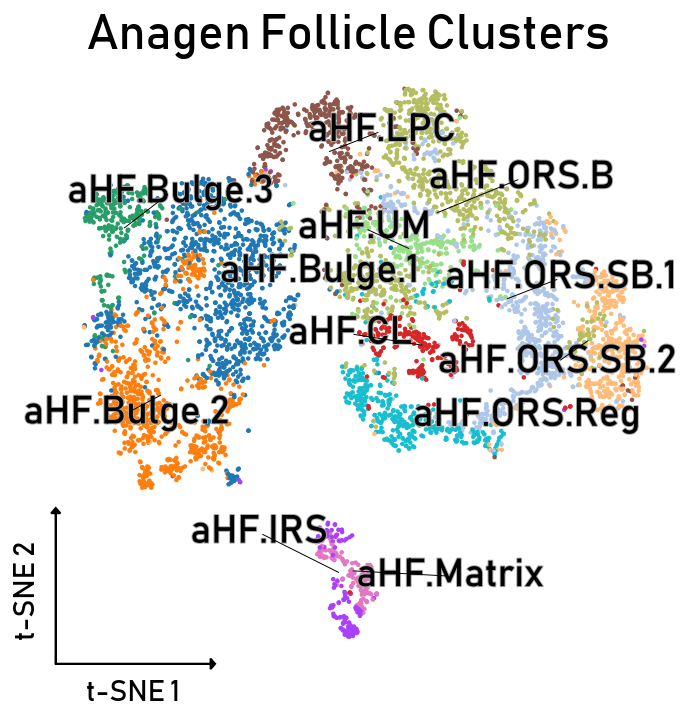

In [21]:
# TSNE — CLUSTERS
ax = plot_tsne_with_labels(
    adata_fol, color_var="fine_clust",
    plot_title="Anagen Follicle Clusters", legend_fontsize=20,
)
plt.savefig(os.path.join(output_dir, "Anagen_Clusters.png"), bbox_inches="tight")


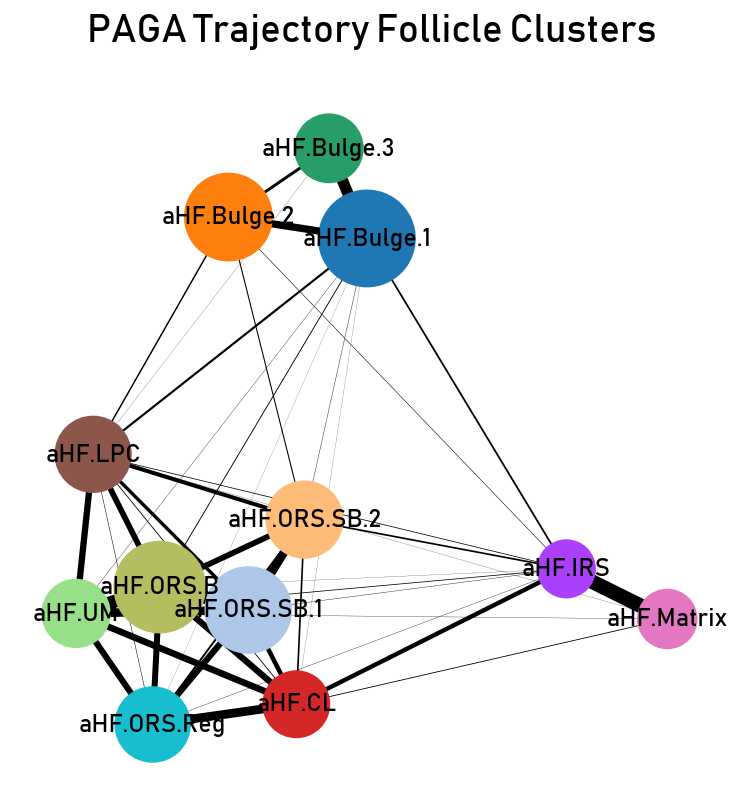

In [22]:
# PAGA GRAPH
ax = sc.pl.paga(
    adata_fol, node_size_power=0.5, node_size_scale=10,
    layout="fa", root=0, frameon=False,
    save=False, show=False,
    title="PAGA Trajectory Follicle Clusters",
)
ax.set_title("PAGA Trajectory Follicle Clusters", fontsize=20, y=1.05)
plt.savefig(os.path.join(output_dir, "Follicle_PAGATrajectories.png"), bbox_inches="tight")


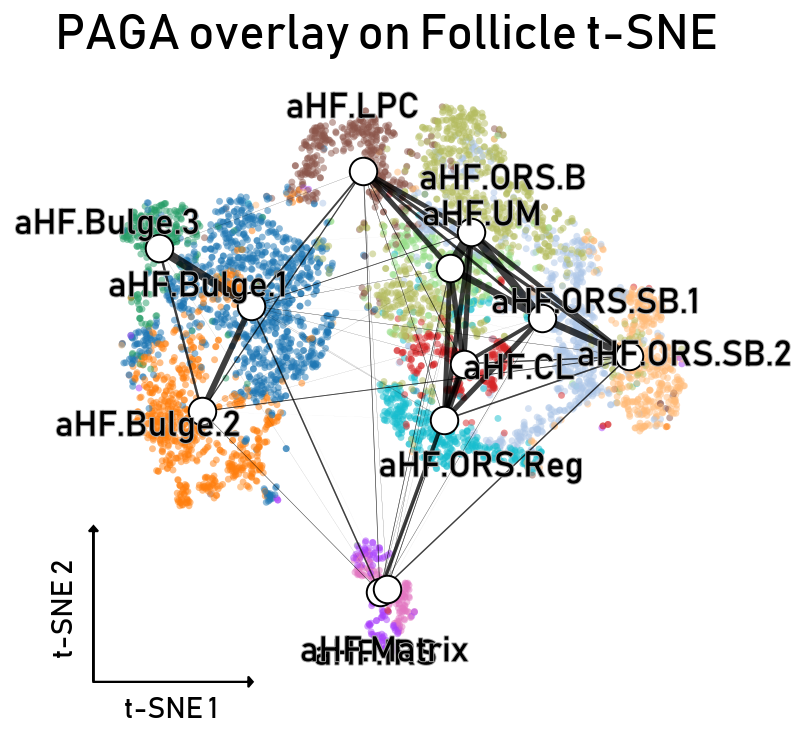

In [23]:
# PAGA OVERLAY ON TSNE
sc.tl.paga(adata_fol, groups="fine_clust")
ax = plot_paga_on_tsne(
    adata_fol, color_var="fine_clust",
    plot_title="PAGA overlay on Follicle t-SNE",
)
plt.savefig(os.path.join(output_dir, "Follicle_PAGA_Overlay.png"), bbox_inches="tight")
plt.show()


In [32]:
root_cell = "_Catagen_GTGGACCCAAGTCGTG-1"

adata_fol.uns["iroot"] = int(
    adata_fol.obs_names.get_loc(root_cell)
)
sc.tl.diffmap(adata_fol)
sc.tl.dpt(adata_fol)

# Define terminal states
terminal_states = pd.Series(
    ["aHF.CL", "aHF.ORS.Reg", "aHF.ORS.SB.1", "aHF.ORS.SB.2", "aHF.ORS.B", "aHF.Matrix", "aHF.IRS"],
    index=["_Anagen_TCCCAGCTCACTAGGC-1", "_Anagen_TAGGGCTTCGTCTCGC-1",
           "_Anagen_ACATCTTCAAACTCAA-1", "_Anagen_GTCATAACAGTACCGA-1",
           "_Anagen_GGCAACCCAATCAGCG-1", "_Anagen_TGCAAAGGTGCGTGAG-1",
           "_Anagen_CAGTCCTCAGGATAGA-1"],
)

# Validate terminal state barcodes exist
for bc in terminal_states.index:
    if bc not in adata_fol.obs_names:
        print(f"  WARNING: barcode '{bc}' not in adata_fol")

dm_res = palantir.utils.run_diffusion_maps(adata_fol, n_components=10)
ms_data = palantir.utils.determine_multiscale_space(adata_fol)
pr_res = palantir.core.run_palantir(
    adata_fol, root_cell, num_waypoints=1000, terminal_states=terminal_states
)

imputed_X = palantir.utils.run_magic_imputation(adata_fol)

Sampling and flocking waypoints...
Time for determining waypoints: 0.00023642778396606445 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.030310893058776857 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


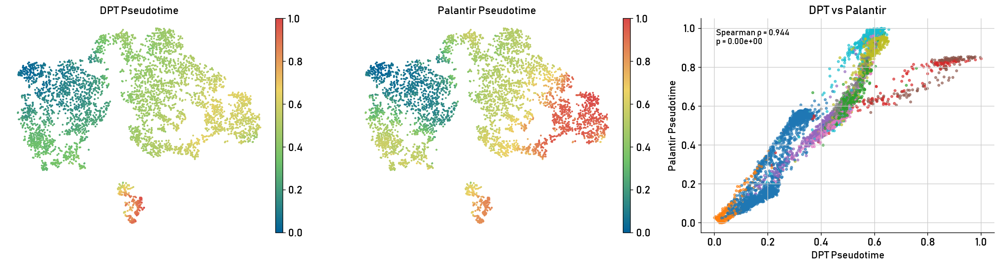

In [33]:
# DPT VS PALANTIR COMPARISON
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.embedding(
    adata_fol, basis="X_tsne", color="dpt_pseudotime",
    ax=axes[0], show=False, cmap="custom_btry",
    title="DPT Pseudotime", frameon=False,
)

sc.pl.embedding(
    adata_fol, basis="X_tsne", color="palantir_pseudotime",
    ax=axes[1], show=False, cmap="custom_btry",
    title="Palantir Pseudotime", frameon=False,
)

axes[2].scatter(
    adata_fol.obs["dpt_pseudotime"],
    adata_fol.obs["palantir_pseudotime"],
    c=adata_fol.obs["fine_clust"].cat.codes,
    cmap="tab10", s=8, alpha=0.6,
)
axes[2].set_xlabel("DPT Pseudotime", fontsize=13)
axes[2].set_ylabel("Palantir Pseudotime", fontsize=13)
axes[2].set_title("DPT vs Palantir", fontsize=15)

rho, pval = spearmanr(
    adata_fol.obs["dpt_pseudotime"],
    adata_fol.obs["palantir_pseudotime"],
)
axes[2].text(
    0.05, 0.95, f"Spearman ρ = {rho:.3f}\np = {pval:.2e}",
    transform=axes[2].transAxes, fontsize=11,
    verticalalignment="top",
)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "DPT_vs_Palantir_comparison.png"),
            dpi=300, bbox_inches="tight")
plt.show()


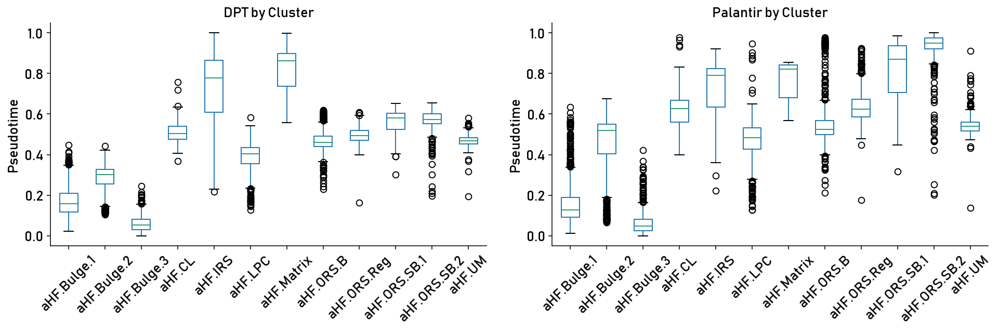

In [34]:
# PER-CLUSTER PSEUDOTIME DISTRIBUTIONS
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

adata_fol.obs.boxplot(
    column="dpt_pseudotime", by="fine_clust",
    ax=axes[0], rot=45, grid=False,
)
axes[0].set_title("DPT by Cluster", fontsize=14)
axes[0].set_xlabel("")
axes[0].set_ylabel("Pseudotime")

adata_fol.obs.boxplot(
    column="palantir_pseudotime", by="fine_clust",
    ax=axes[1], rot=45, grid=False,
)
axes[1].set_title("Palantir by Cluster", fontsize=14)
axes[1].set_xlabel("")
axes[1].set_ylabel("Pseudotime")

fig.suptitle("")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "pseudotime_boxplots_by_cluster.png"),
            dpi=300, bbox_inches="tight")
plt.show()


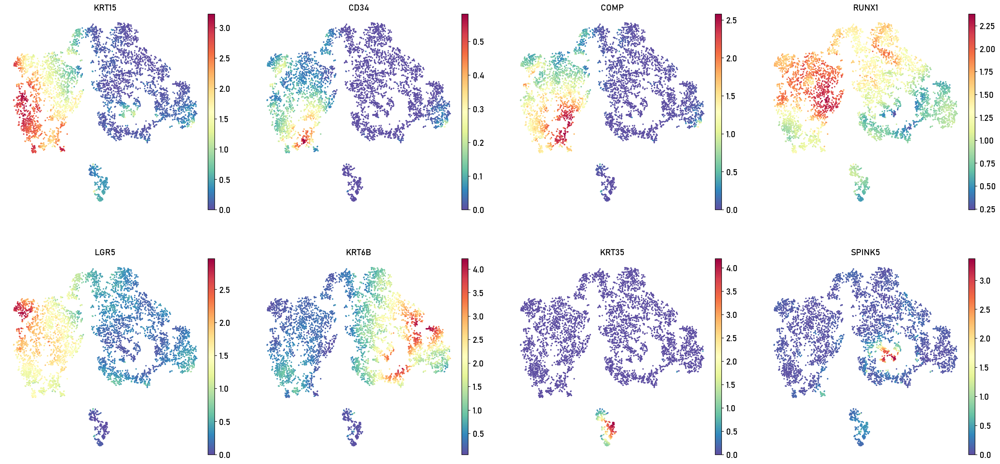

In [35]:
sc.pl.embedding(
    adata_fol,
    basis="tsne",
    layer="MAGIC_imputed_data",
    color=["KRT15", "CD34", "COMP", "RUNX1", "LGR5", "KRT6B", "KRT35", "SPINK5"],
    frameon=False,
)
plt.show()


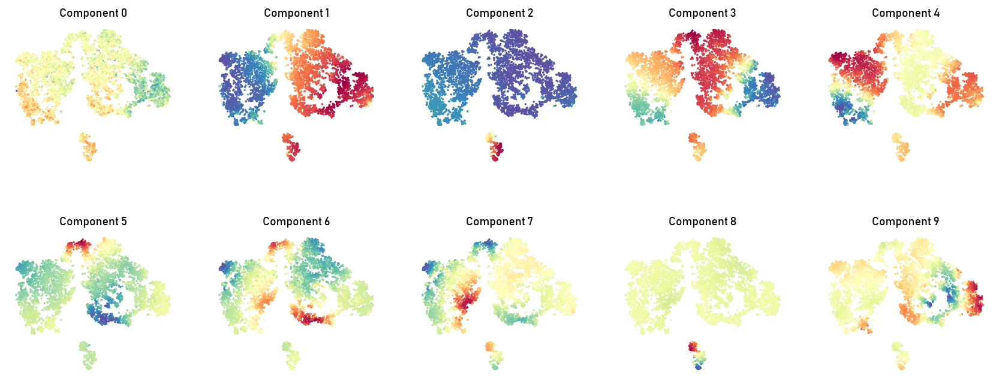

In [36]:
palantir.plot.plot_diffusion_components(adata_fol, embedding_basis="X_tsne")
plt.show()


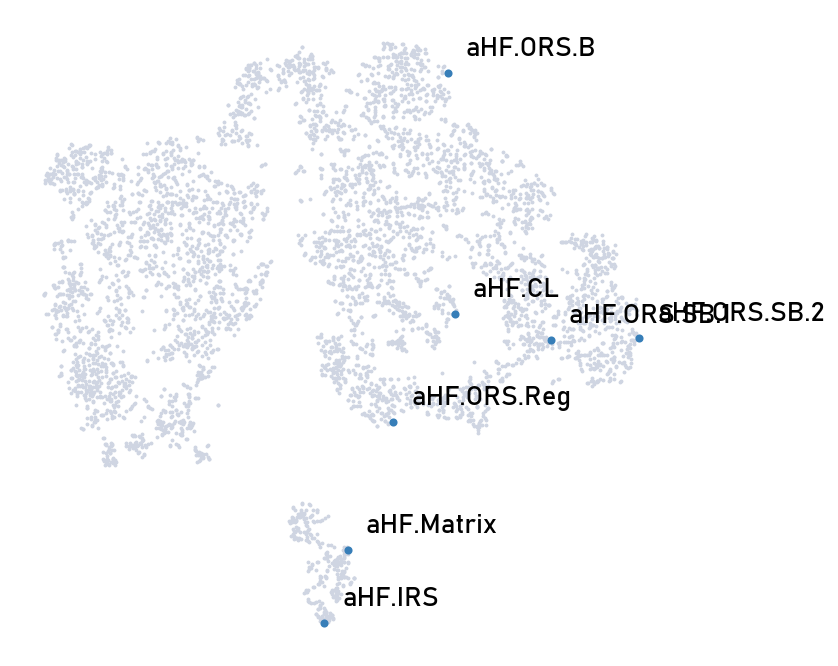

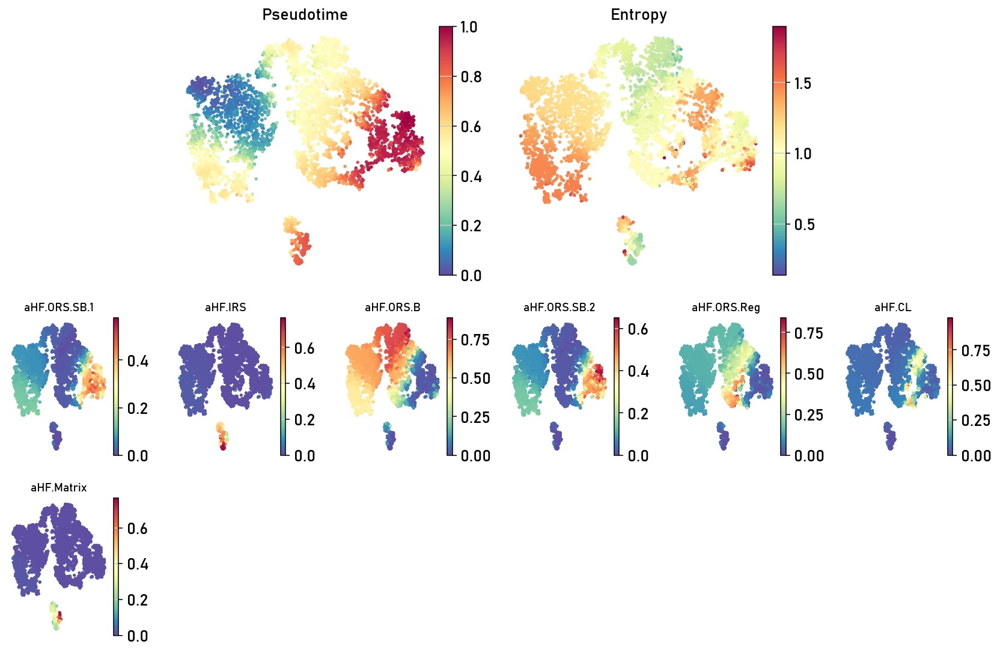

In [37]:
palantir.plot.highlight_cells_on_umap(adata_fol, terminal_states, embedding_basis="X_tsne")
plt.show()

palantir.plot.plot_palantir_results(adata_fol, s=3, embedding_basis="X_tsne")
plt.show()


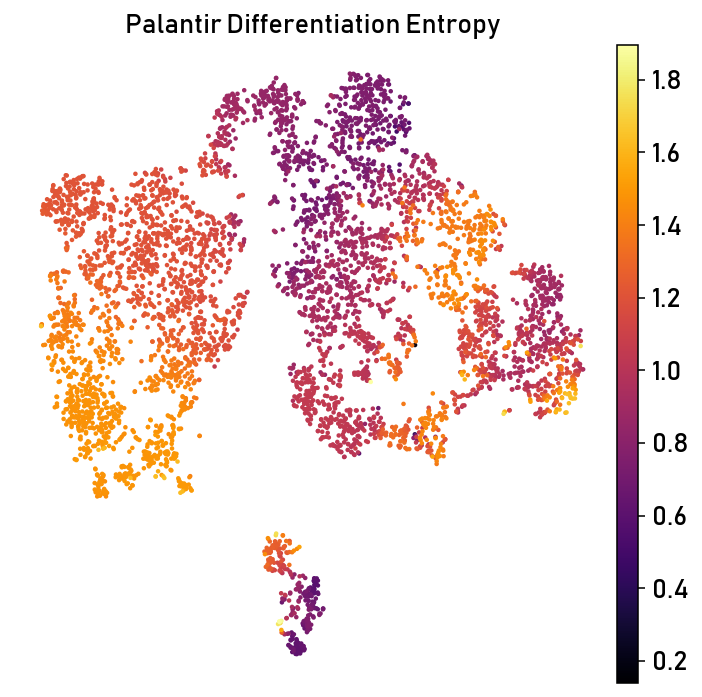

In [38]:
# ENTROPY OF DIFFERENTIATION
if "palantir_entropy" in adata_fol.obs.columns:
    fig, ax = plt.subplots(figsize=FIGSIZE_SINGLE)
    sc.pl.embedding(
        adata_fol, basis="X_tsne", color="palantir_entropy",
        ax=ax, show=False, cmap="inferno",
        title="Palantir Differentiation Entropy", frameon=False,
    )
    plt.savefig(os.path.join(output_dir, "palantir_entropy.png"),
                dpi=300, bbox_inches="tight")
    plt.show()


In [39]:
# SWAP TO PALANTIR PSEUDOTIME
adata_fol.obs["dpt_pseudotime_original"] = adata_fol.obs["dpt_pseudotime"].copy()
adata_fol.obs["dpt_pseudotime"] = adata_fol.obs["palantir_pseudotime"].copy()


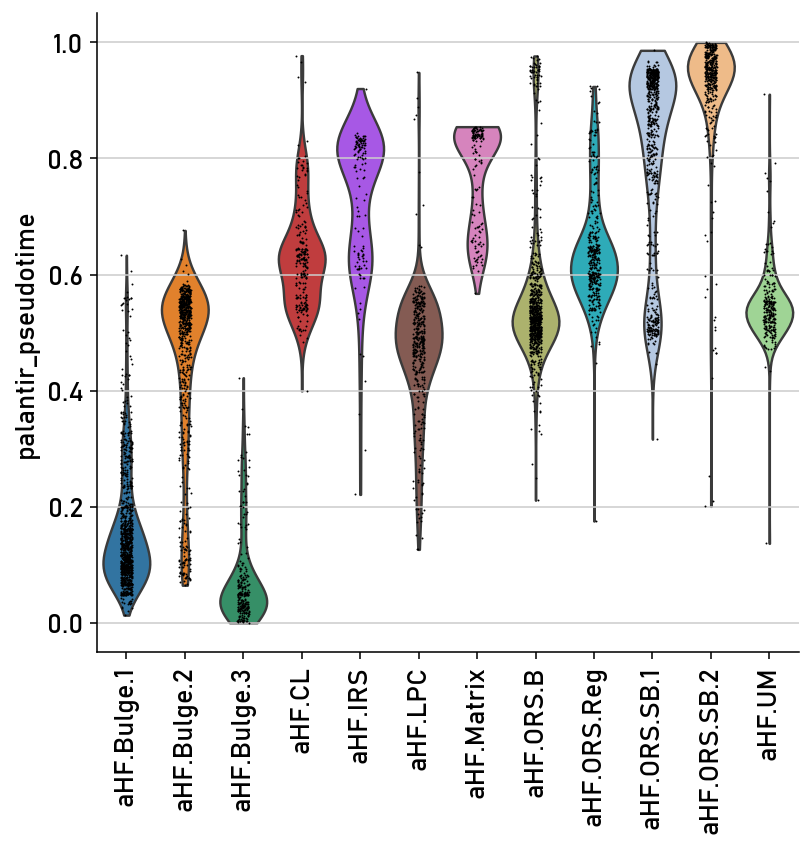

In [40]:
plt.rcParams['figure.figsize'] = [6, 6]

file_path = os.path.join(output_dir, "Follicle_Anagen_PseudoTimeBatch.png")

sc.pl.violin(adata_fol, keys=["palantir_pseudotime"], groupby="fine_clust", rotation=90)

plt.savefig(file_path)
plt.close()


/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


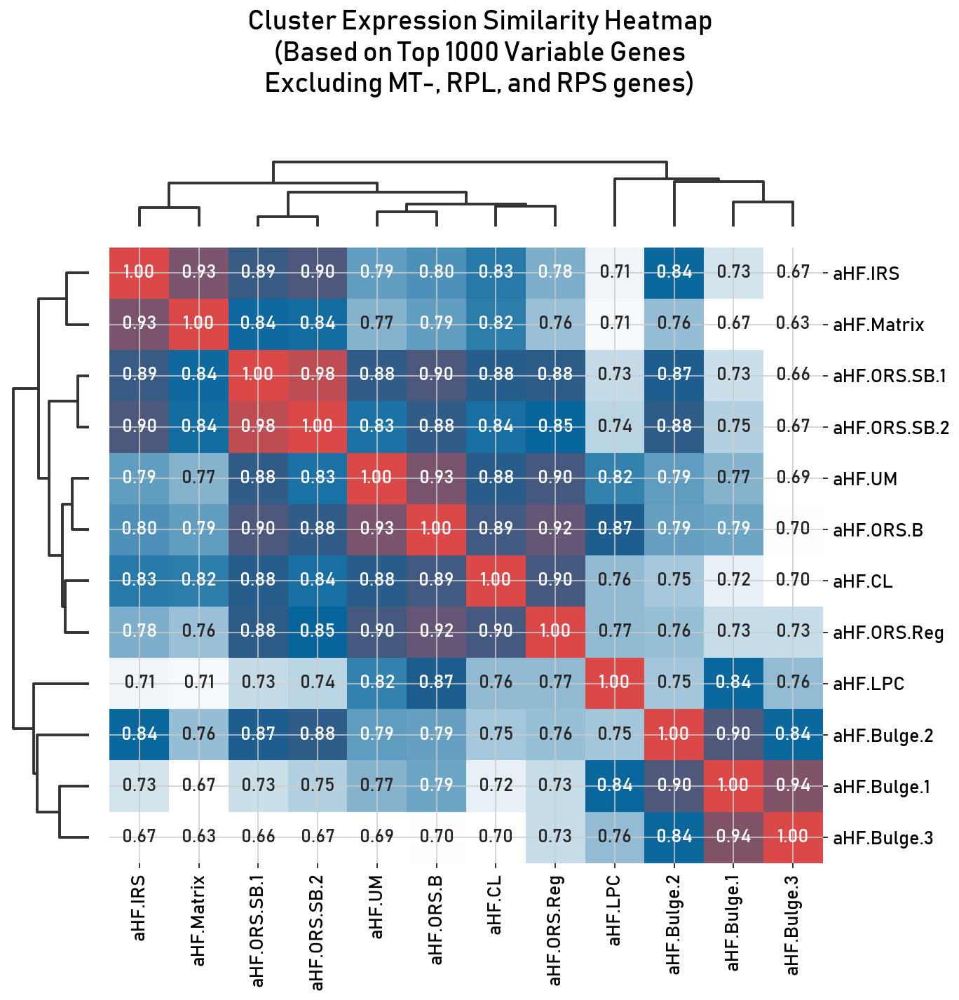

In [41]:
clusters_to_keep = ["aHF.CL", "aHF.UM", "aHF.ORS.Reg", "aHF.ORS.SB.1", "aHF.ORS.SB.2", "aHF.ORS.B", "aHF.IRS", "aHF.Matrix", "aHF.Bulge.1", "aHF.Bulge.2", "aHF.Bulge.3", "aHF.LPC"]

# GENE CHARACTERIZATION — SIMILARITY MATRIX
similarity_matrix, top_genes = calculate_gene_expression_similarity(
    adata_fol, n_top_genes=1000, clusters=clusters_to_keep
)

plot_expression_similarity_heatmap(similarity_matrix)
plt.savefig(os.path.join(output_dir, "Follicle_SimilarityMatrix.png"), bbox_inches="tight")


In [42]:
# GENE CHARACTERIZATION — CLUSTER MARKERS
gene_analysis = analyze_cluster_genes(
    adata_fol, clusters_to_keep, n_genes_display=200,
)

for result in gene_analysis:
    print(f"\nTop 5 genes for {result['cluster']}:")
    for gene, score, log2fc in zip(
        result["top_genes"][:5], result["scores"][:5], result["log2fc"][:5]
    ):
        print(f"  {gene}: score={score:.2f}, log2FC={log2fc:.2f}")



Top 5 genes for aHF.CL:
  DSP: score=17.18, log2FC=2.00
  NEAT1: score=16.98, log2FC=3.51
  NEBL: score=16.68, log2FC=3.63
  CLIP1: score=16.05, log2FC=2.00
  RNF19A: score=15.51, log2FC=2.43

Top 5 genes for aHF.UM:
  ASTL: score=20.33, log2FC=3.95
  IFFO2: score=19.92, log2FC=2.41
  MCL1: score=19.86, log2FC=2.52
  RAB44: score=19.63, log2FC=4.20
  NEAT1: score=18.96, log2FC=3.85

Top 5 genes for aHF.ORS.Reg:
  PARD3B: score=26.75, log2FC=3.49
  TENM4: score=23.33, log2FC=2.86
  PALLD: score=22.90, log2FC=2.03
  KALRN: score=22.55, log2FC=2.48
  CLIP1: score=22.20, log2FC=2.16

Top 5 genes for aHF.ORS.SB.1:
  FABP5: score=31.29, log2FC=3.52
  KRT17: score=29.92, log2FC=3.60
  CALML3: score=28.44, log2FC=3.14
  SFN: score=28.21, log2FC=2.31
  LYPD3: score=28.02, log2FC=2.72

Top 5 genes for aHF.ORS.SB.2:
  S100A2: score=30.13, log2FC=4.26
  APOE: score=29.22, log2FC=3.27
  LGALS1: score=28.84, log2FC=3.88
  S100A14: score=28.67, log2FC=3.09
  APOC1: score=28.14, log2FC=3.81

Top 5 ge

In [43]:
# DENDROGRAM + RANK GENES
sc.tl.dendrogram(adata_fol, cor_method="spearman", groupby="fine_clust")
sc.tl.rank_genes_groups(adata_fol, groupby="fine_clust")


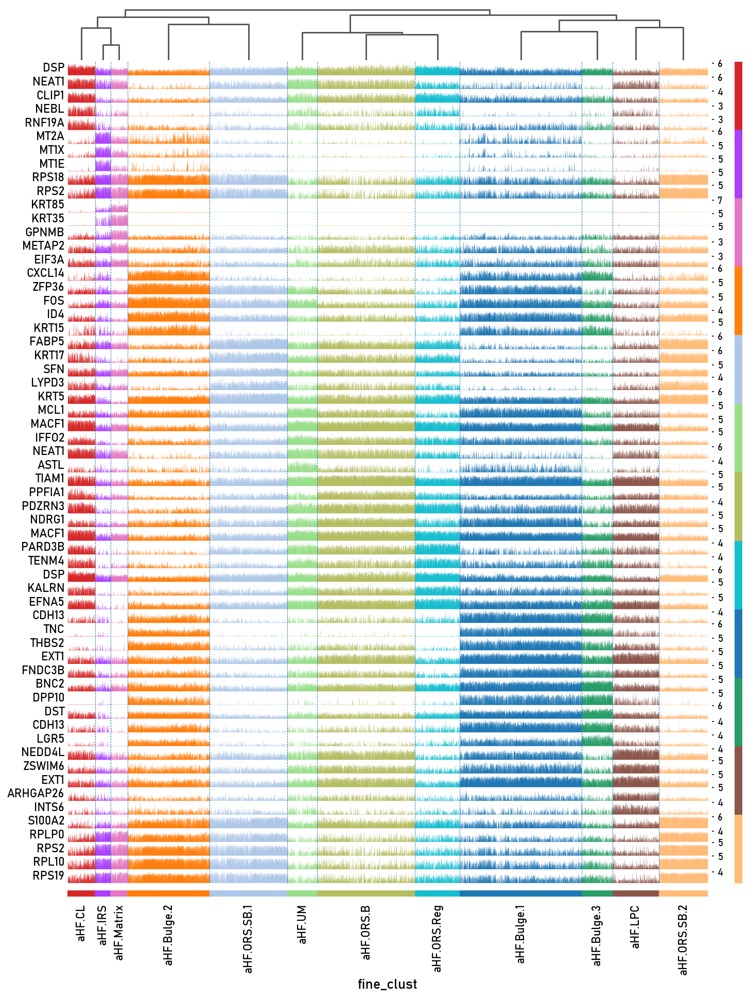

In [44]:
# TRACKSPLOT
with plt.rc_context({"figure.figsize": FIGSIZE_WIDE}):
    sc.pl.rank_genes_groups_tracksplot(
        adata_fol, show=False, min_logfoldchange=0.5, n_genes=5,
    )
    plt.savefig(os.path.join(output_dir, "Gene_Signatures_Follicle.png"), bbox_inches="tight")


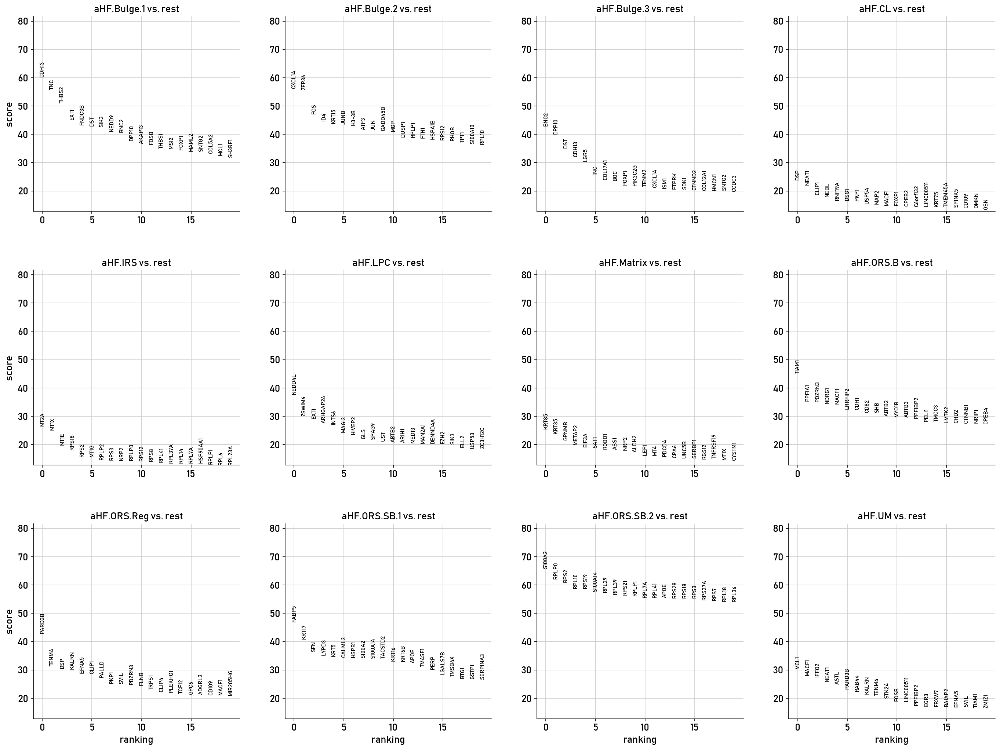

In [45]:
# DOTPLOT
sc.pl.rank_genes_groups(adata_fol, n_genes=20)

Plotting 60 genes


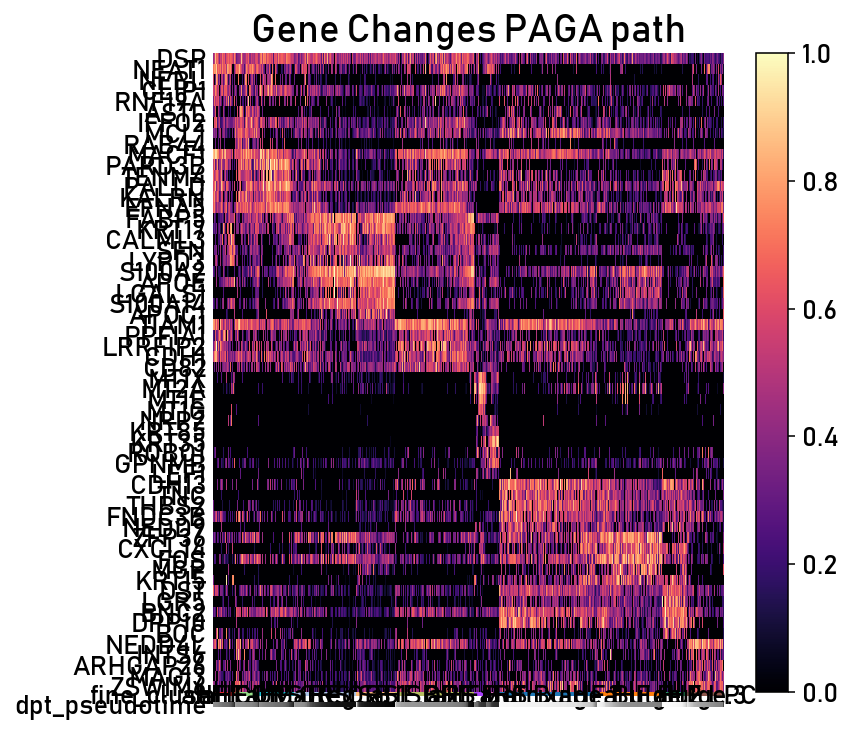

In [48]:
# PAGA PATH — CURATED GENES
n_per_cluster = 5
seen = set()
curated_genes = []
for cluster_data in gene_analysis:
    count = 0
    for gene in cluster_data["top_genes"]:
        if gene not in seen:
            curated_genes.append(gene)
            seen.add(gene)
            count += 1
        if count >= n_per_cluster:
            break

print(f"Plotting {len(curated_genes)} genes")

sc.pl.paga_path(
    adata_fol,
    nodes=clusters_to_keep,
    keys=curated_genes,
    groups_key="fine_clust",
    use_raw=False,
    normalize_to_zero_one=True,
    show_node_names=True,
    show_yticks=True,
    show_colorbar=True,
    color_map="magma",
    show=True,
    title="Gene Changes PAGA path",
    title_fontsize=20,
    save=True,
)


In [49]:
# SPARSE FORMAT CONVERSION
if scipy.sparse.issparse(adata_fol.X):
    adata_fol.X = adata_fol.X.tocsr()

for layer_name in adata_fol.layers:
    if scipy.sparse.issparse(adata_fol.layers[layer_name]):
        adata_fol.layers[layer_name] = adata_fol.layers[layer_name].tocsr()


## CellRank — Combined Kernel & GPCCA

INFO     Computing transition matrix based on adata.obsp['connectivities']                                         
INFO         Finish (0.01s)                                                                                        
INFO     Computing transition matrix based on pseudotime                                                           


  0%|          | 0/5514 [00:00<?, ?cell/s]

INFO         Finish (1.53s)                                                                                        
WARNING  For `method='brandts'`, dense matrix is required. Densifying                                              
INFO     Computing Schur decomposition                                                                             
INFO     When computing macrostates, choose a number of states NOT in ``                                           
INFO     Adding `adata.uns['eigendecomposition_fwd']`                                                              
                `.schur_vectors`                                                                                   
                `.schur_matrix`                                                                                    
                `.eigendecomposition`                                                                              
             Finish (31.57s)                                            

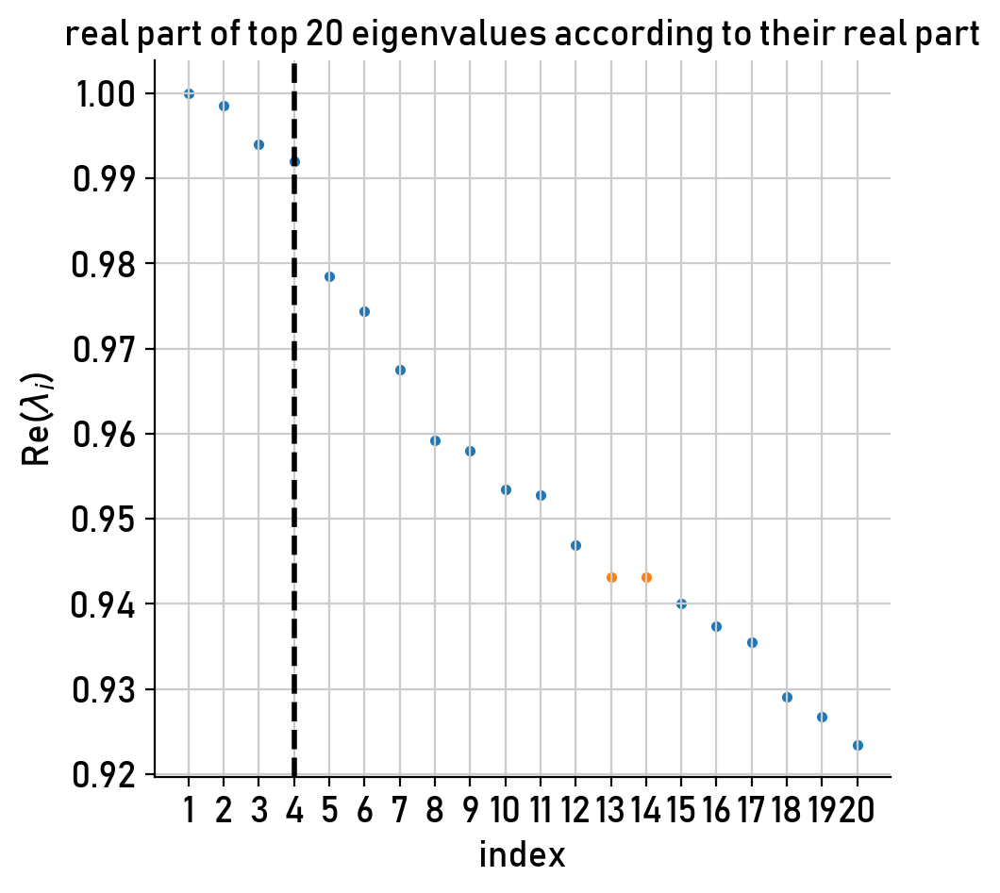

In [51]:
ck = cr.kernels.ConnectivityKernel(adata_fol).compute_transition_matrix()
pk = cr.kernels.PseudotimeKernel(adata_fol, time_key="palantir_pseudotime")
pk.compute_transition_matrix(threshold_scheme="soft", frac_to_keep=0.4)
combined = 0.6 * pk + 0.4 * ck

# Persist the directed transition matrix to obsp for potential downstream use
adata_fol.obsp["T_fwd"] = combined.transition_matrix

g = cr.estimators.GPCCA(combined)
g.compute_schur(method="brandts")
g.plot_spectrum(real_only=True)

INFO     Projecting transition matrix onto 'tsne'                                                                  
INFO     Adding `adata.obsm['T_fwd_tsne']` (0.64s)                                                                 


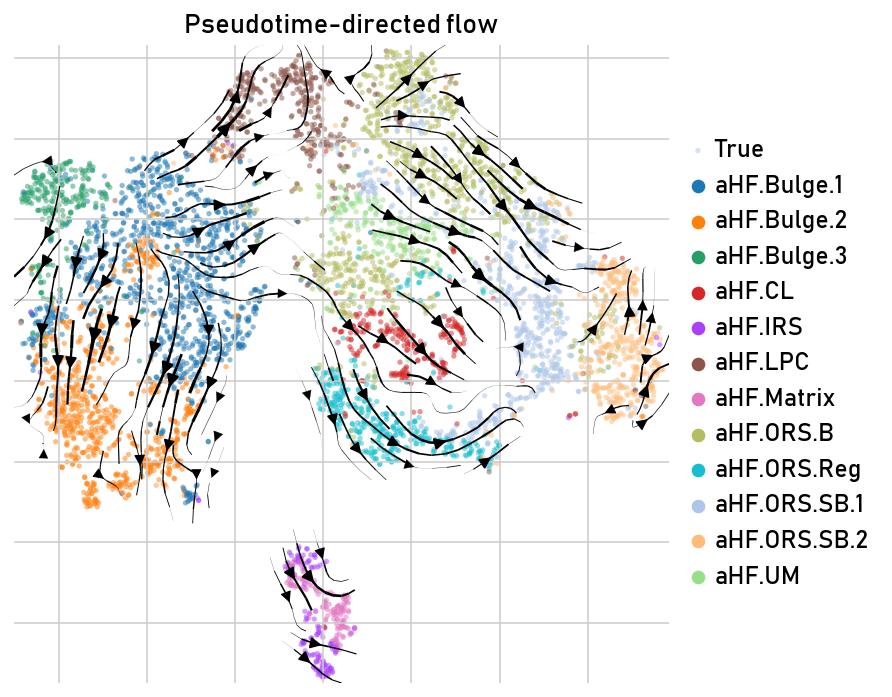

In [52]:
pk.plot_projection(
    basis="tsne",
    recompute=True,
    color="fine_clust",
    legend_loc="right margin",
    title="Pseudotime-directed flow",
    label = True,
    size=30,          
    alpha=0.5,        
    density=1.5,     
    arrow_size=1.2,   
)

INFO     Calculating minChi criterion in interval `[15, 20]`                                                       
INFO     Computing 19 macrostates                                                                                  
WARNING  The following terminal states have different number of cells than requested (30): {'aHF.Bulge.1_1': 24}   
INFO     Adding `.macrostates`                                                                                     
                `.macrostates_memberships`                                                                         
                `.coarse_T`                                                                                        
                `.coarse_initial_distribution                                                                      
                `.coarse_stationary_distribution`                                                                  
                `.schur_vectors`                                        

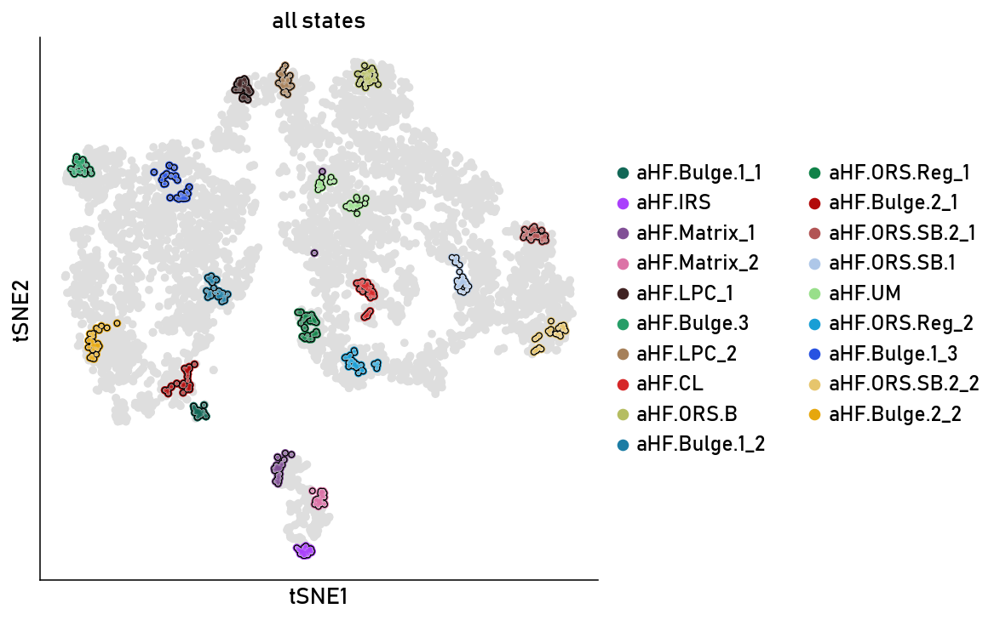

In [54]:
g.compute_macrostates(n_states=[15,20], cluster_key="fine_clust")
g.plot_macrostates(which="all", legend_loc="right", s=100, basis="tsne")

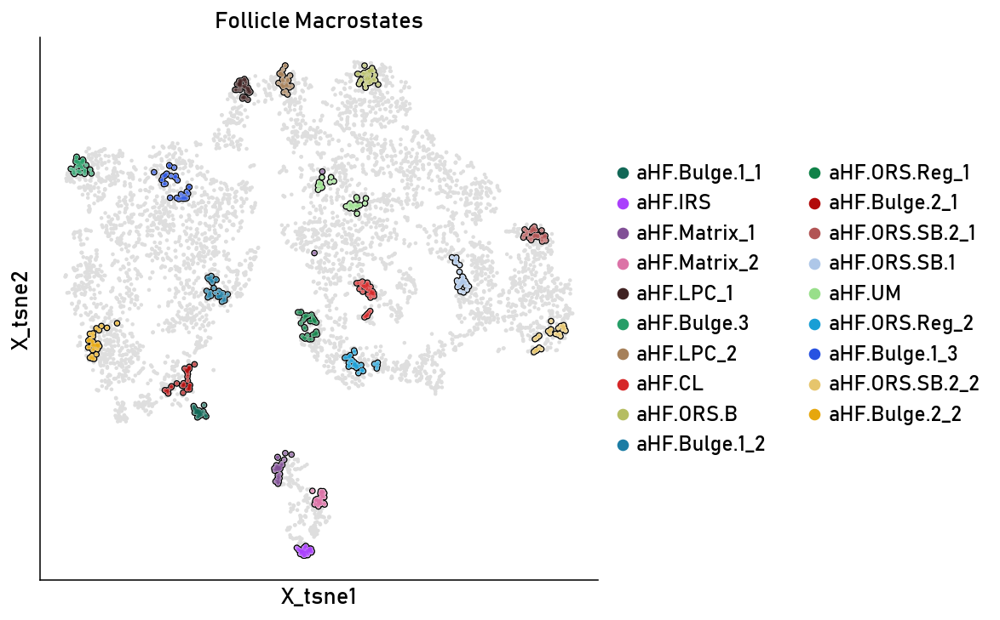

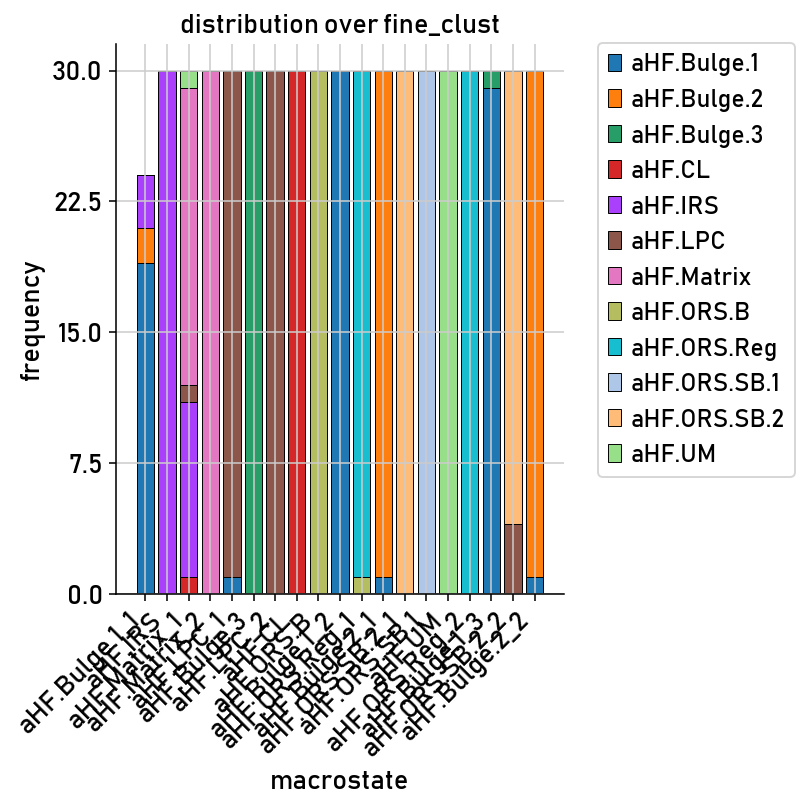

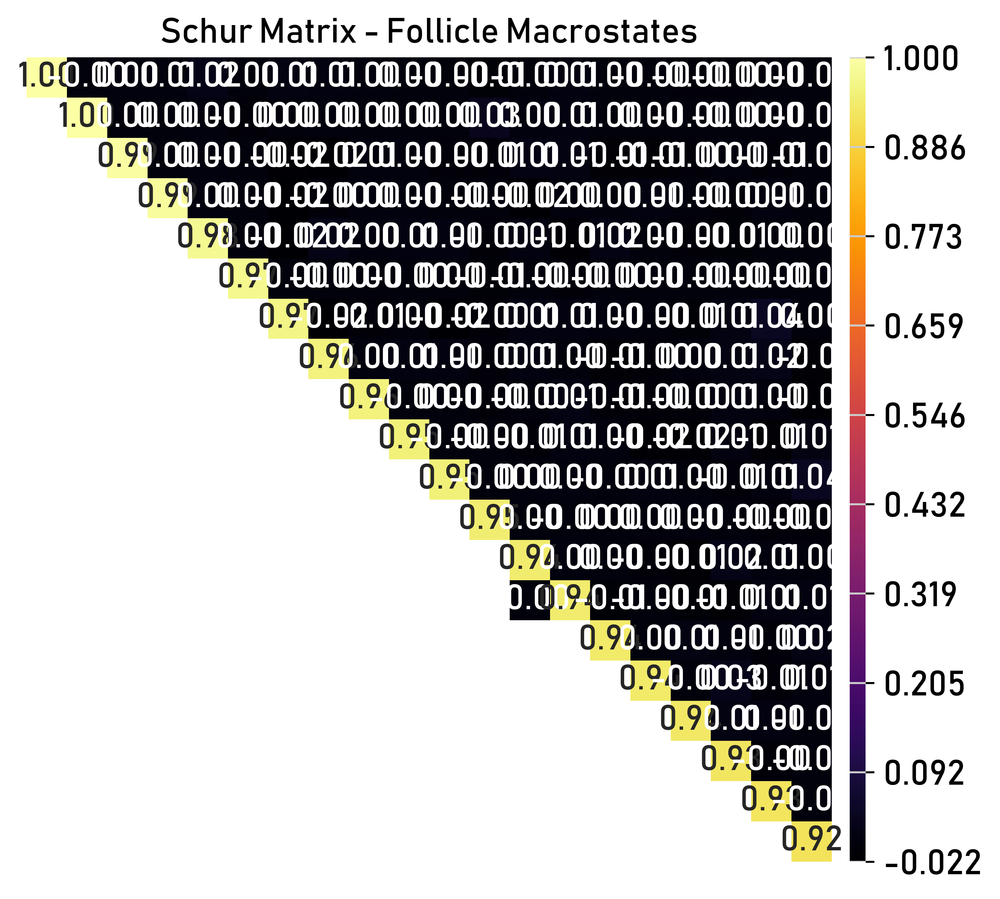

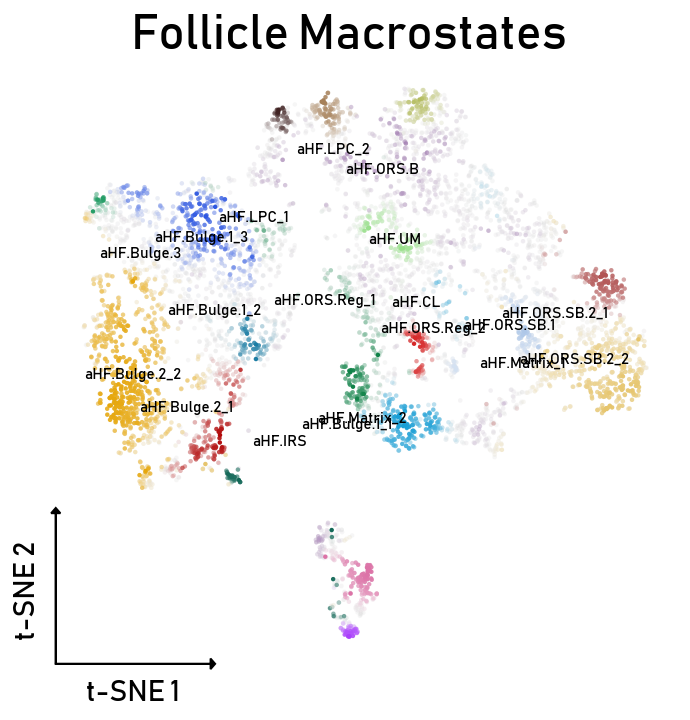

In [55]:
# MACROSTATE VISUALIZATIONS
g.plot_macrostates(
    which="all", basis="X_tsne", legend_loc="right",
    title="Follicle Macrostates",
    save=os.path.join(output_dir, "Follicle_macrostates_tsne.png"),
)

g.plot_macrostate_composition(
    key="fine_clust",
    save=os.path.join(output_dir, "Follicle_macrostate_composition.png"),
)

g.plot_schur_matrix(
    title="Schur Matrix - Follicle Macrostates",
    cmap="inferno", figsize=FIGSIZE_SINGLE, dpi=300,
    save=os.path.join(output_dir, "Follicle_schur_matrix.png"),
)

ax = plot_macrostates_tsne(adata_fol, g, plot_title="Follicle Macrostates")
plt.savefig(os.path.join(output_dir, "Follicle_macrostates_tsne_custom.png"), bbox_inches="tight")


In [56]:
g.set_initial_states(states=["aHF.Bulge.3"])
g.set_terminal_states(states=["aHF.CL", "aHF.ORS.Reg_2", "aHF.ORS.SB.1", "aHF.ORS.SB.2_2", "aHF.ORS.B", "aHF.Matrix_2", "aHF.IRS"])


INFO     Adding `adata.obs['init_states_fwd']`                                                                     
                `adata.obs['init_states_fwd_probs']`                                                               
                `.initial_states`                                                                                  
                `.initial_states_probabilities`                                                                    
                `.initial_states_memberships                                                                       
             Finish`                                                                                               
INFO     Adding `adata.obs['term_states_fwd']`                                                                     
                `adata.obs['term_states_fwd_probs']`                                                               
                `.terminal_states`                                      

GPCCA[kernel=(0.6 * PseudotimeKernel[n=5514] + 0.4 * ConnectivityKernel[n=5514]), initial_states=[np.str_('aHF.Bulge.3')], terminal_states=[np.str_('aHF.CL'), np.str_('aHF.IRS'), np.str_('aHF.Matrix_2'), np.str_('aHF.ORS.B'), np.str_('aHF.ORS.Reg_2'), np.str_('aHF.ORS.SB.1'), np.str_('aHF.ORS.SB.2_2')]]

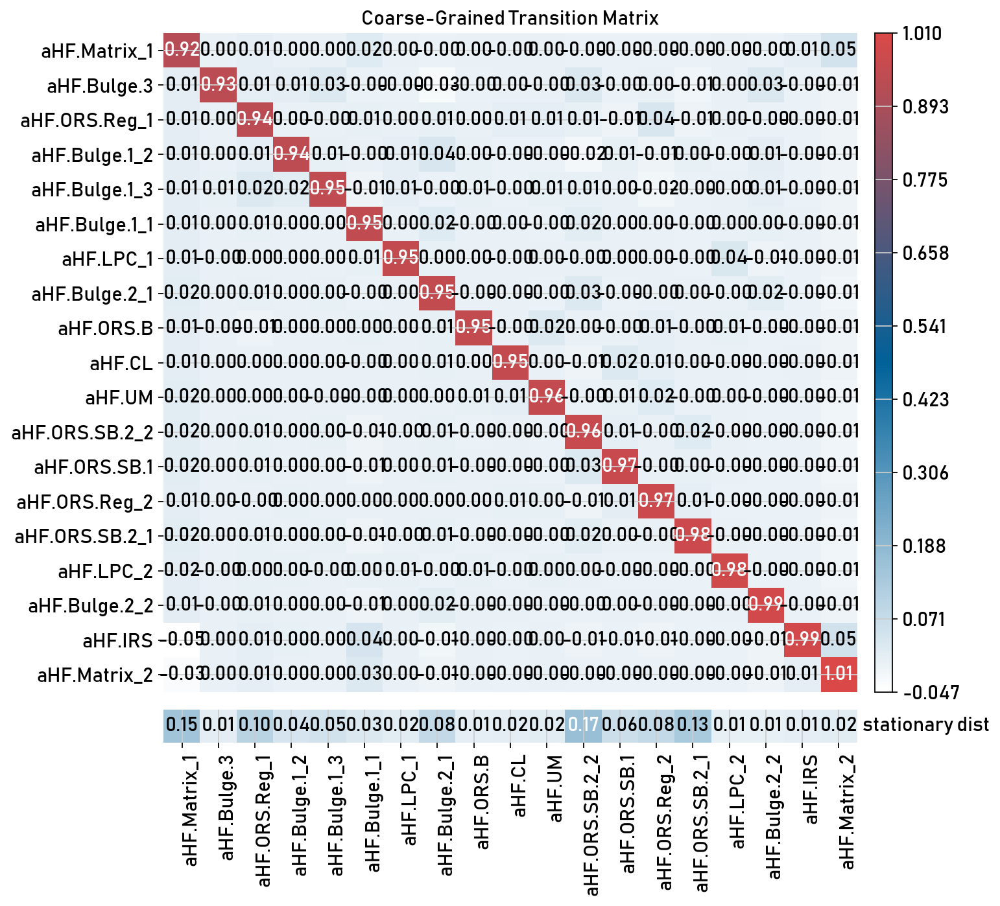

In [57]:
# COARSE-GRAINED TRANSITION MATRIX
g.plot_coarse_T(
    title="Coarse-Grained Transition Matrix",
    figsize=(9, 9), xtick_rotation=90, cmap="custom_wbr",
    save=os.path.join(output_dir, "Follicle_CoarseTMatrix.png"),
)


### Diagnostic: Inspect `g.coarse_T`

Before computing fate probabilities, verify that the coarse-grained transition matrix
has meaningful transition probabilities. This is the matrix that `derive_topology()` will use.


In [58]:
# Diagnostic: inspect the coarse_T matrix
print("Macrostates in coarse_T:")
print(g.coarse_T.index.tolist())
print(f"\nShape: {g.coarse_T.shape}")
print(f"\nNon-zero entries: {(g.coarse_T.values > 1e-10).sum()}")
print(f"Total entries: {g.coarse_T.size}")
print(f"\nCoarse_T matrix (first 10 rows/cols):")
print(g.coarse_T.iloc[:10, :10].round(4))


Macrostates in coarse_T:
['aHF.Bulge.1_1', 'aHF.IRS', 'aHF.Matrix_1', 'aHF.Matrix_2', 'aHF.LPC_1', 'aHF.Bulge.3', 'aHF.LPC_2', 'aHF.CL', 'aHF.ORS.B', 'aHF.Bulge.1_2', 'aHF.ORS.Reg_1', 'aHF.Bulge.2_1', 'aHF.ORS.SB.2_1', 'aHF.ORS.SB.1', 'aHF.UM', 'aHF.ORS.Reg_2', 'aHF.Bulge.1_3', 'aHF.ORS.SB.2_2', 'aHF.Bulge.2_2']

Shape: (19, 19)

Non-zero entries: 203
Total entries: 361

Coarse_T matrix (first 10 rows/cols):
               aHF.Bulge.1_1  aHF.IRS  aHF.Matrix_1  aHF.Matrix_2  aHF.LPC_1  \
aHF.Bulge.1_1         0.9458  -0.0004        0.0134       -0.0076     0.0007   
aHF.IRS               0.0427   0.9881       -0.0467        0.0492     0.0004   
aHF.Matrix_1          0.0216   0.0105        0.9226        0.0482     0.0007   
aHF.Matrix_2          0.0262   0.0107       -0.0324        1.0104     0.0004   
aHF.LPC_1             0.0067  -0.0017        0.0139       -0.0081     0.9491   
aHF.Bulge.3          -0.0027  -0.0015        0.0138       -0.0087    -0.0045   
aHF.LPC_2             0.0050

INFO     Computing fate probabilities                                                                              


  0%|          | 0/7 [00:00<?, ?/s]

INFO     Adding `adata.obsm['lineages_fwd']`                                                                       
                `.fate_probabilities`                                                                              
             Finish (1.47s)                                                                                        
INFO     Computing eigendecomposition of the transition matrix                                                     
INFO     Adding `adata.uns['eigendecomposition_fwd']`                                                              
                `.eigendecomposition`                                                                              
             Finish (0.20s)                                                                                        


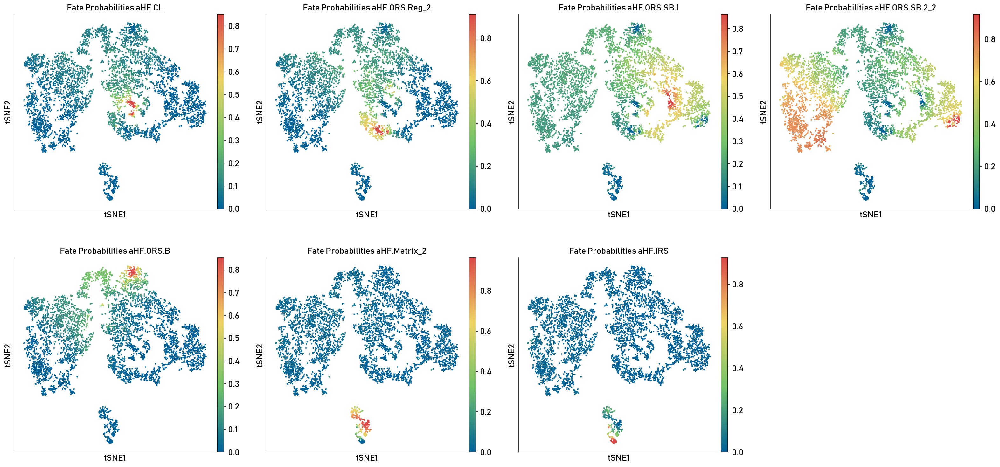

In [59]:
g.compute_fate_probabilities()
g.compute_eigendecomposition()

titles = [f"Fate Probabilities {s}" for s in g.terminal_states.cat.categories]

g.plot_fate_probabilities(
    same_plot=False,
    cmap="custom_btry",
    title=titles,
    basis='tsne',
    frameon=True,
    save=os.path.join(output_dir, "Follicle_Anagen_FateProbabilities.png"),
)


In [60]:
# DRIVER GENES PER MACROSTATE — DE ON MAGIC-IMPUTED DATA

# Identify the correct macrostate column name
macro_cols = [col for col in adata_fol.obs.columns if "macro" in col.lower()]
print("Available macrostate columns:", macro_cols)

# Use macrostates_fwd if it exists, otherwise fall back to macrostates
macrostate_col = "macrostates_fwd" if "macrostates_fwd" in adata_fol.obs.columns else "macrostates"
print(f"Using: {macrostate_col}")

macrostate_names = adata_fol.obs[macrostate_col].cat.categories.tolist()
print("Macrostates:", macrostate_names)

sc.tl.rank_genes_groups(
    adata_fol, groupby=macrostate_col,
    method="wilcoxon", layer="MAGIC_imputed_data",
)

n_top = 50
macrostate_drivers = {}

for state in macrostate_names:
    df = sc.get.rank_genes_groups_df(adata_fol, group=state)
    df_sig = df[(df["pvals_adj"] < 0.05) & (df["logfoldchanges"] > 0.5)]
    macrostate_drivers[state] = df_sig.head(n_top)["names"].tolist()
    print(f"\n{state} top {min(n_top, len(df_sig))} drivers:")
    print(f"  {macrostate_drivers[state][:10]}")

for state, genes in macrostate_drivers.items():
    df = sc.get.rank_genes_groups_df(adata_fol, group=state)
    safe_name = state.replace(".", "_").replace(" ", "_")
    df.to_csv(os.path.join(output_dir, f"drivers_{safe_name}.csv"), index=False)


Available macrostate columns: ['macrostates_fwd', 'macrostates']
Using: macrostates_fwd
Macrostates: ['aHF.Bulge.1_1', 'aHF.IRS', 'aHF.Matrix_1', 'aHF.Matrix_2', 'aHF.LPC_1', 'aHF.Bulge.3', 'aHF.LPC_2', 'aHF.CL', 'aHF.ORS.B', 'aHF.Bulge.1_2', 'aHF.ORS.Reg_1', 'aHF.Bulge.2_1', 'aHF.ORS.SB.2_1', 'aHF.ORS.SB.1', 'aHF.UM', 'aHF.ORS.Reg_2', 'aHF.Bulge.1_3', 'aHF.ORS.SB.2_2', 'aHF.Bulge.2_2']

aHF.Bulge.1_1 top 50 drivers:
  ['ENSG00000288057', 'WNT7B', 'STYXL2', 'PTGER4P2-CDK2AP2P2', 'PCDHGA12', 'ENSG00000272667', 'ENSG00000287968', 'C8B', 'DAB2', 'ENSG00000272856']

aHF.IRS top 50 drivers:
  ['SLC39A1', 'ENSG00000278920', 'RBM48', 'METTL7B', 'DDX28', 'UFD1-AS1', 'ENSG00000277459', 'CCNI', 'FRY-AS1', 'CNIH2']

aHF.Matrix_1 top 50 drivers:
  ['ENSG00000282936', 'ENSG00000276136', 'UGT1A7', 'CFAP61', 'ST7-OT4', 'MSH4', 'ENSG00000254987', 'CDC25A', 'FBXL18', 'PPP4R1-AS1']

aHF.Matrix_2 top 50 drivers:
  ['DENND10', 'GPR15LG', 'HTATSF1', 'KRT36', 'ENSG00000288754', 'ALOX5', 'IMPACT', 'SPRR2E', 

## Topology Derivation

This cell uses `derive_topology(g, ...)` which reads `g.coarse_T` — the coarse-grained
transition matrix computed during `compute_macrostates()`.


In [72]:
driver_df = g.compute_lineage_drivers()

initial_state = "aHF.Bulge.3"
terminal_states = [
    "aHF.CL",
    "aHF.ORS.Reg_2",
    "aHF.ORS.SB.1",
    "aHF.ORS.SB.2_2",
    "aHF.ORS.B",
    "aHF.Matrix_2",
    "aHF.IRS",
]

arm_colors = {
    "aHF.CL":        "#E87040",
    "aHF.ORS.Reg_2": "#9B59B6",
    "aHF.ORS.SB.1":  "#2ECC71",
    "aHF.ORS.SB.2_2":"#3498DB",
    "aHF.ORS.B":     "#F1C40F",
    "aHF.Matrix_2":  "#E74C3C",
    "aHF.IRS":       "#1ABC9C",
}

#Custom genes are derived from later gene driver analysis but are manually inserted here.

follicle_custom_genes = {
     "aHF.CL":        ["MACF1", "GSTP1"],
     "aHF.ORS.SB.1":  ["LGALS7B", "CD34", "COMP", "CRABP2"],
     "aHF.ORS.B":     ["EXT1"],
     "aHF.ORS.SB.2_2":["S100A2", "APOE"],
     "aHF.ORS.Reg_2": ["TENM4", "PARD3B", "KALRN", "EFNA5"],
     "aHF.Matrix_2":  ["KRT35", "MSX1", "NRP2"],
     "aHF.IRS":       ["KRT71", "KRT74", "GATA3"],
}

# use g.coarse_T via derive_topology
trunk_states, lineage_arms, branch_point = derive_topology(
    estimator=g,
    initial_state=initial_state,
    terminal_states=terminal_states,
    threshold=0.0,
)


INFO     Adding `adata.varm['terminal_lineage_drivers']`                                                           
                `.lineage_drivers`                                                                                 
             Finish (0.52s)                                                                                        

Macrostate graph: 19 nodes, 184 edges

Top 20 edges by transition probability:
  aHF.IRS -> aHF.Matrix_2  (0.0492)
  aHF.Matrix_1 -> aHF.Matrix_2  (0.0482)
  aHF.IRS -> aHF.Bulge.1_1  (0.0427)
  aHF.ORS.Reg_1 -> aHF.ORS.Reg_2  (0.0369)
  aHF.Bulge.1_2 -> aHF.Bulge.2_1  (0.0368)
  aHF.LPC_1 -> aHF.LPC_2  (0.0355)
  aHF.Bulge.3 -> aHF.Bulge.2_2  (0.0317)
  aHF.Bulge.3 -> aHF.ORS.SB.2_2  (0.0294)
  aHF.Bulge.3 -> aHF.Bulge.1_3  (0.0276)
  aHF.Bulge.2_1 -> aHF.ORS.SB.2_2  (0.0274)
  aHF.ORS.SB.1 -> aHF.ORS.SB.2_2  (0.0272)
  aHF.Matrix_2 -> aHF.Bulge.1_1  (0.0262)
  aHF.ORS.B -> aHF.UM  (0.0248)
  aHF.CL -> aHF.ORS.SB.1  (0.0244)
  aHF.Bulge.1_3 -

Mean pseudotime per macrostate:
  aHF.Bulge.3                pt = 0.0292
  aHF.Bulge.1_3              pt = 0.0629
  aHF.Bulge.1_2              pt = 0.1458
  aHF.LPC_1                  pt = 0.4448
  aHF.ORS.B                  pt = 0.5071
  aHF.UM                     pt = 0.5176
  aHF.Bulge.2_1              pt = 0.5241
  aHF.Bulge.2_2              pt = 0.5407
  aHF.Bulge.1_1              pt = 0.5464
  aHF.ORS.Reg_1              pt = 0.5507
  aHF.LPC_2                  pt = 0.5661
  aHF.Matrix_1               pt = 0.6080
  aHF.CL                     pt = 0.6171
  aHF.ORS.Reg_2              pt = 0.6466
  aHF.IRS                    pt = 0.8248
  aHF.Matrix_2               pt = 0.8462
  aHF.ORS.SB.2_2             pt = 0.8722
  aHF.ORS.SB.1               pt = 0.9245
  aHF.ORS.SB.2_1             pt = 0.9918

Edge filtering: 139 above threshold
  Removed (backward):  62
  Removed (too far):   11
  Kept:                66

Top edges in constrained graph:
  aHF.IRS              → aHF.Matrix_2    

/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as 

0 [ 0.5709120353 -0.7008679949]
1 [0.9381053061 0.0413664528]
2 [-0.5203365193 -0.0053626961]
3 [ 0.8887240471 -0.7204214948]
4 [0.4749118735 0.7224194756]
5 [-0.3413860025 -0.1608970782]


/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as 

0 [ 0.4763472067 -0.3716663459]
1 [ 0.3563229567 -0.4748108612]
2 [0.650239535  0.1650361198]
3 [0.0118513004 0.1698006496]
4 [-0.0853668049  0.1448501673]
5 [ 0.2198422847 -0.6077119923]


/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as 

3 [-0.2637846114 -0.0073556036]
4 [0.696271403  0.9101299673]
5 [-0.1861072239 -0.0902101019]


/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
/tmp/ipykernel_2266194/556043532.py:394: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as 

0 [-0.0860952104  0.6494499993]
1 [-0.5674602785  0.7864904298]
0 [-0.9943268704 -0.178400956 ]
1 [-0.1774723429  0.7221903252]
2 [ 0.9573372907 -0.2647579374]
5 [-0.9930762289  0.5337497426]
6 [0.5434600031 0.3383191589]
0 [-0.1003360134  0.9649187554]
1 [ 0.3996951232 -0.5531529307]
9 [0.1375111276 0.331049586 ]
10 [ 0.0357848384 -0.1308341199]
0 [ 0.6260525    -0.0680265468]
1 [-0.543011745  -0.3908076116]
0 [ 0.730053656  -0.0744963295]
1 [0.574326827  0.5446205521]


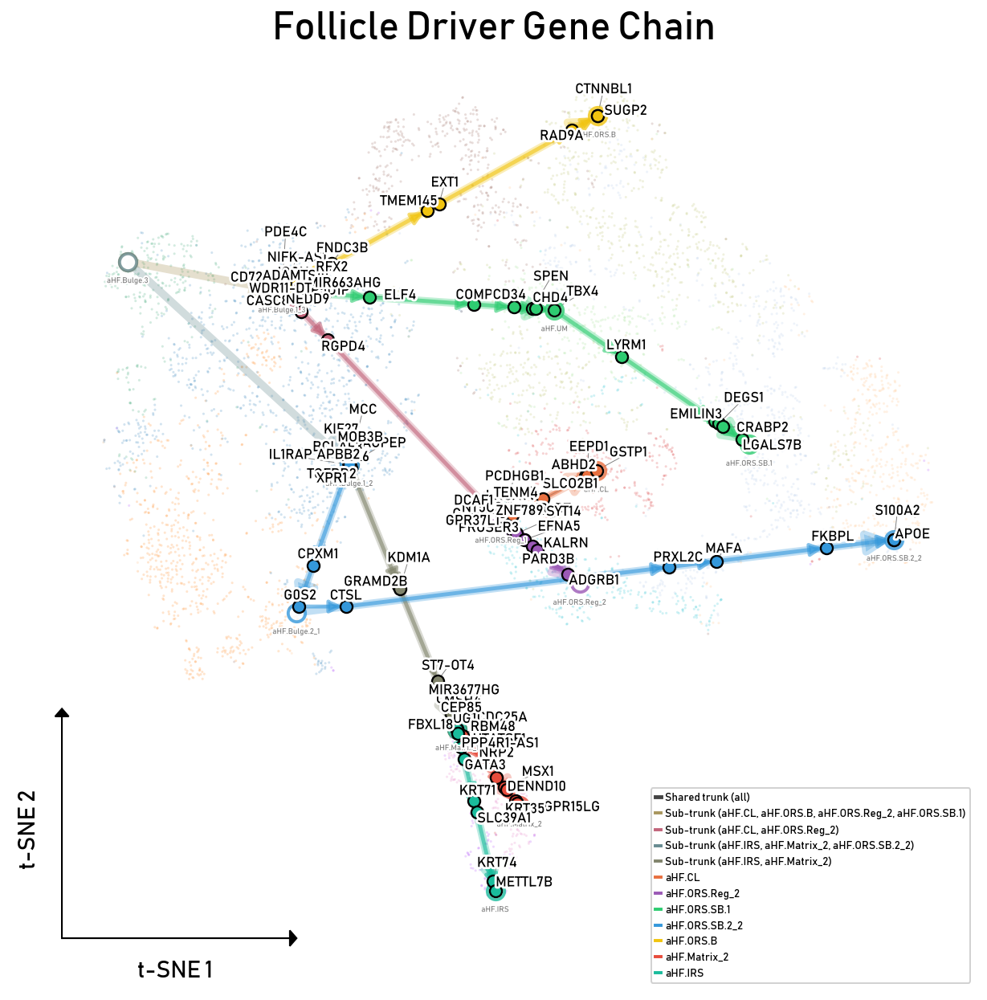

In [79]:
segments, paths = derive_hierarchical_topology(
    estimator=g,
    adata=adata_fol,
    initial_state=initial_state,
    terminal_states=terminal_states,
    pseudotime_key="palantir_pseudotime",
    macrostate_col=macrostate_col,
    threshold=0.001,
    max_pt_jump=0.5,
    pt_slack=0.01,
)

macrostate_col = "macrostates_fwd" if "macrostates_fwd" in adata_fol.obs.columns else "macrostates"

fig, ax = plt.subplots(figsize=(11, 11))

sc.pl.embedding(
    adata_fol, basis="X_tsne", color="fine_clust",
    ax=ax, show=False, frameon=False, alpha=0.2, size=10, title="",
)

plot_tree_gene_chain(
    adata_fol,
    macrostate_drivers,
    segments=segments,
    arm_colors=arm_colors,
    ax=ax,
    pseudotime_key="palantir_pseudotime",
    trunk_color="#444444",
    custom_genes=follicle_custom_genes,
    n_genes_per_state=3,
    macrostate_col=macrostate_col,
    basis="X_tsne",
    blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0", "MT-", "RPS", "RPL"),
)

# Legend: trunk + sub-trunks + arms
legend_elements = [
    Line2D([0], [0], color="#444444", lw=2.5, label="Shared trunk (all)"),
]
# Find sub-trunk segments for legend
for seg in segments:
    n = len(seg["terminals"])
    if 1 < n < len(terminal_states):
        names = sorted(seg["terminals"])
        rgb = np.array([mcolors.to_rgb(arm_colors.get(t, "#888888"))
                        for t in names])
        color = tuple(rgb.mean(axis=0))
        label = f"Sub-trunk ({', '.join(names)})"
        entry = Line2D([0], [0], color=color, lw=2, label=label)
        # Avoid duplicate legend entries
        if label not in [e.get_label() for e in legend_elements]:
            legend_elements.append(entry)

legend_elements.extend([
    Line2D([0], [0], color=c, lw=2, label=name)
    for name, c in arm_colors.items()
])
ax.legend(handles=legend_elements, loc="lower right", fontsize=7, framealpha=0.9)

_style_embedding_ax(ax, "Follicle Driver Gene Chain")
plt.savefig(os.path.join(output_dir, "gene_chain_follicle_tree.png"),
            dpi=300, bbox_inches="tight")
plt.show()

## Gene Trends along Lineages
This section fits gene expression trends along each lineage using generalised additive models,
providing smoothed expression curves over pseudotime for the top driver genes per arm.


In [80]:
print("── obsm keys containing lineage/fate data ──")
for k in sorted(adata_fol.obsm.keys()):
    if any(tag in k.lower() for tag in ["lineage", "fate", "term", "macro", "init"]):
        shape = adata_fol.obsm[k].shape if hasattr(adata_fol.obsm[k], 'shape') else '?'
        print(f"  {k:40s}  {shape}")

# Re-run compute_fate_probabilities if the estimator lost its state
# (happens after kernel restart — obsm data persists in the h5ad but the
# live estimator object doesn't know about it)
if g.fate_probabilities is None:
    print("\n  g.fate_probabilities is None — re-running compute_fate_probabilities()...")
    g.compute_fate_probabilities()
    print(f"  Done. Shape: {g.fate_probabilities.shape}")
    print(f"  Lineage names: {g.fate_probabilities.names.tolist()}")
else:
    print(f"\n  g.fate_probabilities exists: {g.fate_probabilities.shape}")
    print(f"  Lineage names: {g.fate_probabilities.names.tolist()}")

# Verify lineages_fwd is in obsm and matches
lineage_key = "lineages_fwd"
if lineage_key in adata_fol.obsm:
    stored = adata_fol.obsm[lineage_key]
    fp = g.fate_probabilities
    if stored.shape != fp.shape:
        print(f"\n  WARNING: obsm['{lineage_key}'] shape {stored.shape} != "
              f"g.fate_probabilities shape {fp.shape}")
        print(f"  Overwriting obsm with current estimator values...")
        adata_fol.obsm[lineage_key] = fp
    else:
        print(f"\n  obsm['{lineage_key}'] matches estimator ✓")
else:
    print(f"\n  Writing g.fate_probabilities → obsm['{lineage_key}']")
    adata_fol.obsm[lineage_key] = g.fate_probabilities

# Parse driver_df columns to extract unique lineage base names
# Column format: {lineage_name}_{stat} where stat ∈ {corr, pval, qval, ci_low, ci_high}
stat_suffixes = ["_corr", "_pval", "_qval", "_ci_low", "_ci_high"]

lineage_names_from_drivers = []
for col in driver_df.columns:
    for suffix in stat_suffixes:
        if col.endswith(suffix):
            base = col[: -len(suffix)]
            if base not in lineage_names_from_drivers:
                lineage_names_from_drivers.append(base)
            break

print(f"\n── Lineage names parsed from driver_df columns ──")
for name in lineage_names_from_drivers:
    corr_col = f"{name}_corr"
    n_sig = (driver_df[corr_col].abs() > 0.3).sum() if corr_col in driver_df.columns else 0
    print(f"  {name:30s}  ({n_sig} genes with |corr| > 0.3)")

# Cross-check with fate probability lineage names
fp_names = g.fate_probabilities.names.tolist()
print(f"\n── Cross-check ──")
print(f"  Fate probability lineages: {fp_names}")
print(f"  Driver DF lineages:        {lineage_names_from_drivers}")
matched = set(lineage_names_from_drivers) & set(fp_names)
unmatched_drivers = set(lineage_names_from_drivers) - set(fp_names)
unmatched_fp = set(fp_names) - set(lineage_names_from_drivers)
print(f"  Matched: {matched}")
if unmatched_drivers:
    print(f"  In drivers but not in fate probs: {unmatched_drivers}")
if unmatched_fp:
    print(f"  In fate probs but not in drivers: {unmatched_fp}")

── obsm keys containing lineage/fate data ──
  init_states_fwd_memberships               (5514, 1)
  lineages_fwd                              (5514, 7)
  macrostates_fwd_memberships               (5514, 19)
  palantir_fate_probabilities               (5514, 7)
  term_states_fwd_memberships               (5514, 7)

  g.fate_probabilities exists: (5514, 7)
  Lineage names: ['aHF.CL', 'aHF.ORS.Reg_2', 'aHF.ORS.SB.1', 'aHF.ORS.SB.2_2', 'aHF.ORS.B', 'aHF.Matrix_2', 'aHF.IRS']

  obsm['lineages_fwd'] matches estimator ✓

── Lineage names parsed from driver_df columns ──
  aHF.CL                          (195 genes with |corr| > 0.3)
  aHF.ORS.Reg_2                   (386 genes with |corr| > 0.3)
  aHF.ORS.SB.1                    (139 genes with |corr| > 0.3)
  aHF.ORS.SB.2_2                  (423 genes with |corr| > 0.3)
  aHF.ORS.B                       (303 genes with |corr| > 0.3)
  aHF.Matrix_2                    (72 genes with |corr| > 0.3)
  aHF.IRS                         (41 genes w

  aHF.CL: ['SPINK5', 'MACF1', 'USP54', 'NEBL', 'WFDC10B', 'S100A2']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

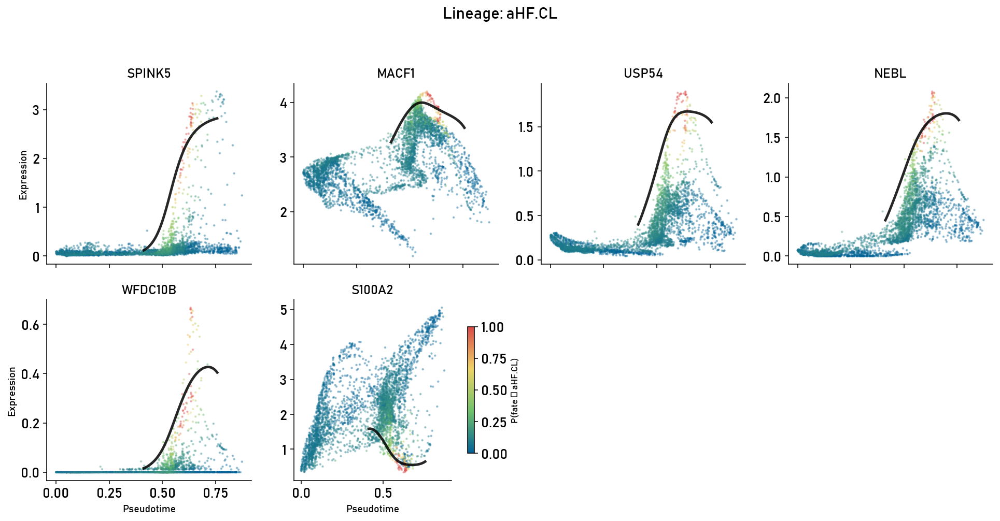

  aHF.ORS.Reg_2: ['H3-3B', 'FTH1']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

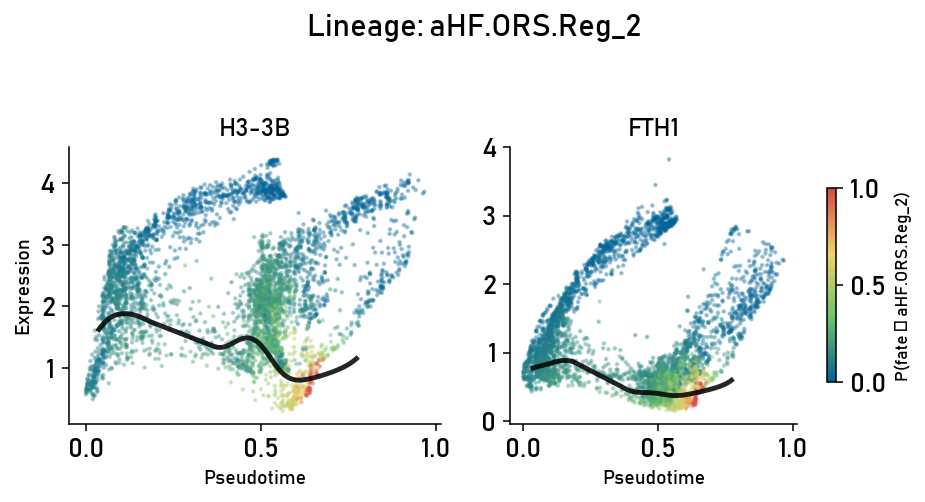

  aHF.ORS.SB.1: ['KRT17', 'KRT6B', 'KRT16', 'CALML3', 'LGALS7B', 'FABP5', 'TM4SF1', 'LYPD3']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

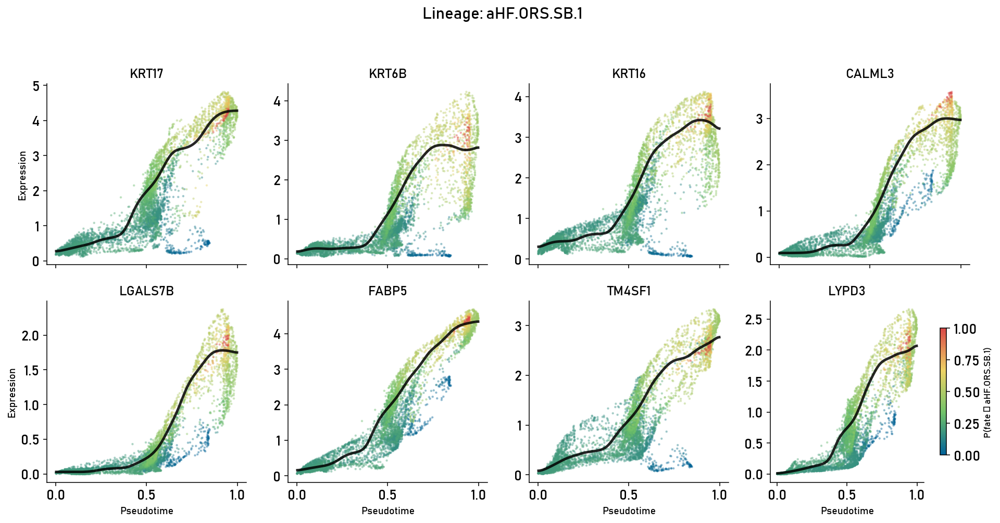

  aHF.ORS.SB.2_2: ['CXCL14', 'MGP', 'ID4', 'IGFBP7', 'FGL2', 'S100A10', 'KRT15', 'FTH1']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

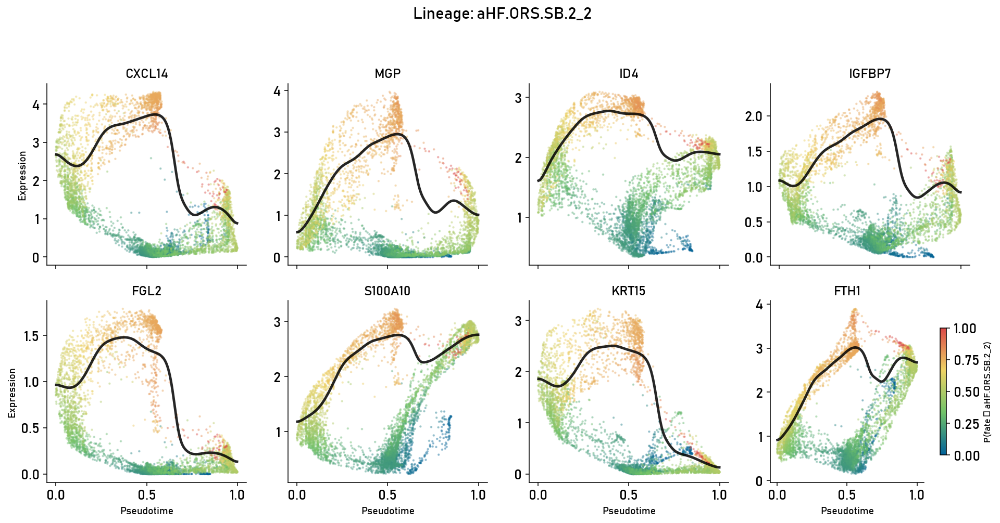

  aHF.ORS.B: ['EEF1A1']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

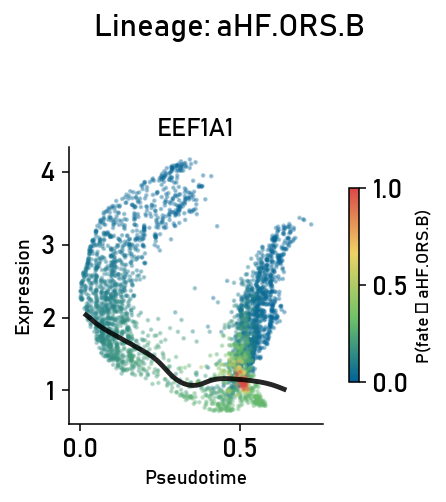

  aHF.Matrix_2: ['KRT85', 'KRT35', 'CPA6', 'SELENBP1', 'LY6G6D', 'NRP2', 'TNFRSF19', 'PRR9']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

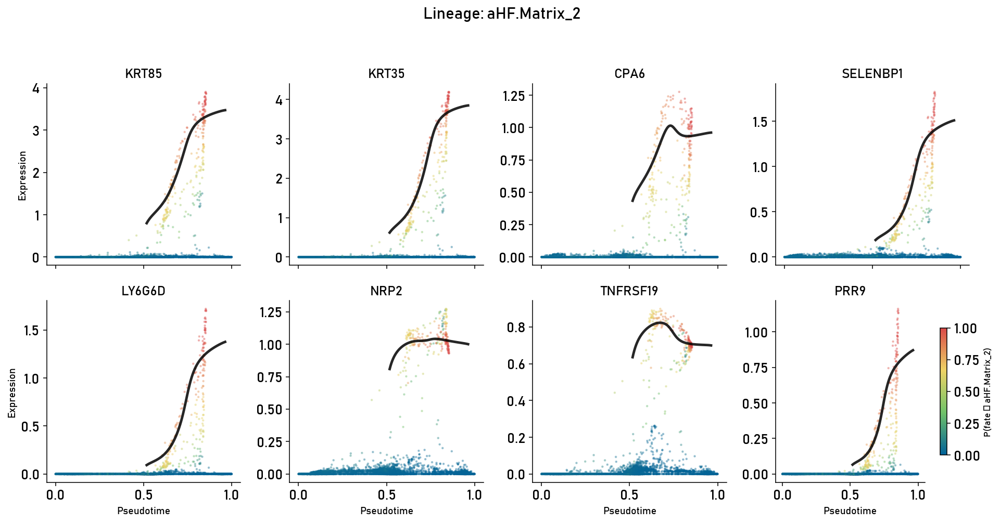

  aHF.IRS: ['NRP2', 'DLX2', 'UBE2C', 'TNFRSF19', 'MAD2L1', 'KRT28', 'H3C2']


/tmp/ipykernel_2266194/611482578.py:154: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  plt.tight_layout()
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/tmp/ipykernel_2266194/611482578.py:190: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.savefig(
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figure(bytes_io, **kw)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8594 (\N{RIGHTWARDS ARROW}) missing from font(s) Bahnschrift.
  fig.canvas.print_figur

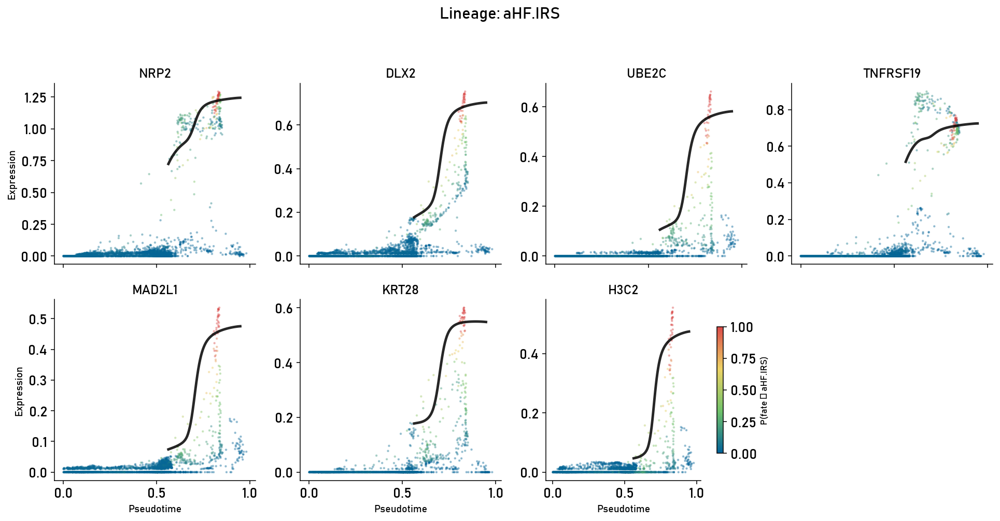

In [83]:
# GENE TRENDS PER LINEAGE — fate-probability-weighted smoothing

#
# The trend line estimates E[expression | committed to this lineage] by
# computing: smooth(expr × fate_prob) / smooth(fate_prob).
#
# This is a Nadaraya-Watson kernel regression with fate probability as the
# importance weight. Cells with high commitment to the lineage dominate
# the curve; cells diverging toward other fates contribute negligibly.

from scipy.ndimage import gaussian_filter1d


def fate_weighted_trend(pt, expr, fate, n_bins=200, sigma=8,
                        trim_frac=0.01, fate_power=3):
    """
    Compute a fate-probability-weighted expression trend over pseudotime.

    trend(t) = smooth(Σ expr_i · w_i) / smooth(Σ w_i)
    where w_i = fate_i^fate_power

    fate_power controls how aggressively uncommitted cells are suppressed:
      power=1: linear weighting (original — too soft, uncommitted cells dominate)
      power=2: fate=0.1 contributes 100x less than fate=1.0
      power=3: fate=0.1 contributes 1000x less than fate=1.0 (recommended)
      power=4+: nearly hard threshold, trend follows only the most committed cells

    With power=3, 200 cells at fate=0.15 contribute 0.675 total weight,
    while 5 cells at fate=0.9 contribute 3.645 — the committed cells
    dominate the trend by 5:1 even when outnumbered 40:1.
    """
    pt_min, pt_max = np.nanmin(pt), np.nanmax(pt)
    bin_edges = np.linspace(pt_min, pt_max, n_bins + 1)
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    bin_idx = np.digitize(pt, bin_edges) - 1
    bin_idx = np.clip(bin_idx, 0, n_bins - 1)

    # Raise fate to a power to suppress uncommitted cells
    w = fate ** fate_power

    numerator = np.zeros(n_bins)
    denominator = np.zeros(n_bins)
    for b in range(n_bins):
        mask = bin_idx == b
        if mask.any():
            numerator[b] = np.sum(expr[mask] * w[mask])
            denominator[b] = np.sum(w[mask])

    num_smooth = gaussian_filter1d(numerator, sigma=sigma)
    den_smooth = gaussian_filter1d(denominator, sigma=sigma)

    den_peak = den_smooth.max()
    valid = den_smooth > (trim_frac * den_peak)

    trend = np.full(n_bins, np.nan)
    trend[valid] = num_smooth[valid] / den_smooth[valid]

    return bin_centers, trend

def plot_gene_trends_custom(
    adata, genes, lineage_name,
    pseudotime_key="palantir_pseudotime",
    lineage_key="lineages_fwd",
    layer="MAGIC_imputed_data",
    fate_threshold=0.01,
    n_bins=200, sigma=8,
    max_cols=4,
    figsize_per_gene=(3.5, 3.5),
    cmap="custom_btry",
):
    n_genes = len(genes)
    ncols = min(n_genes, max_cols)
    nrows = int(np.ceil(n_genes / ncols))

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(figsize_per_gene[0] * ncols, figsize_per_gene[1] * nrows),
        squeeze=False,
    )

    pt = adata.obs[pseudotime_key].values
    fate = adata.obsm[lineage_key]

    if hasattr(fate, "names"):
        lin_idx = fate.names.tolist().index(lineage_name)
    else:
        raise ValueError(f"Cannot find lineage names in obsm['{lineage_key}']")

    fate_col = np.asarray(fate[:, lin_idx]).flatten()
    valid_pt = ~np.isnan(pt)

    for j, gene in enumerate(genes):
        row, col = divmod(j, ncols)
        ax = axes[row, col]

        gene_idx = list(adata.var_names).index(gene)
        if layer and layer in adata.layers:
            expr_raw = adata.layers[layer][:, gene_idx]
        else:
            expr_raw = adata.X[:, gene_idx]

        if scipy.sparse.issparse(expr_raw):
            expr_all = np.asarray(expr_raw.todense()).flatten()
        else:
            expr_all = np.asarray(expr_raw).flatten()

        show = valid_pt & (fate_col > fate_threshold)
        order = np.argsort(fate_col[show])
        ax.scatter(
            pt[show][order], expr_all[show][order],
            c=fate_col[show][order], cmap=cmap,
            s=2, alpha=0.3, vmin=0, vmax=1, rasterized=True,
        )

        bin_centers, trend = fate_weighted_trend(
            pt[valid_pt], expr_all[valid_pt], fate_col[valid_pt],
            n_bins=n_bins, sigma=sigma,
        )
        valid_trend = ~np.isnan(trend)
        ax.plot(bin_centers[valid_trend], trend[valid_trend],
                color="black", lw=2.5, alpha=0.85, zorder=5)

        ax.set_title(gene, fontsize=13, fontweight="bold")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(False)

        # Only label outer edges
        if row == nrows - 1:
            ax.set_xlabel("Pseudotime", fontsize=10)
        else:
            ax.set_xlabel("")
            ax.tick_params(labelbottom=False)

        if col == 0:
            ax.set_ylabel("Expression", fontsize=10)
        else:
            ax.set_ylabel("")

    # Hide unused axes in the last row
    for k in range(n_genes, nrows * ncols):
        row, col = divmod(k, ncols)
        axes[row, col].set_visible(False)

    # Colorbar on the last visible axis
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    last_row, last_col = divmod(n_genes - 1, ncols)
    cbar = fig.colorbar(sm, ax=axes[last_row, last_col], shrink=0.7, pad=0.08)
    cbar.set_label(f"P(fate → {lineage_name})", fontsize=9)

    fig.suptitle(f"Lineage: {lineage_name}", fontsize=16, y=1.03)
    plt.tight_layout()
    return fig


# Run for all lineages

for lineage in lineage_names_from_drivers:
    corr_col = f"{lineage}_corr"
    if corr_col not in driver_df.columns:
        print(f"  {lineage}: no correlation column found, skipping")
        continue

    ranked = driver_df[corr_col].abs().sort_values(ascending=False)
    top_drivers = [g for g in ranked.head(15).index.tolist()
                   if g in adata_fol.var_names
                   and not any(g.upper().startswith(p)
                               for p in ["MT", "MT-", "RPL", "RPS",
                                          "ENSG", "LINC", "LOC"])][:8]
    if not top_drivers:
        print(f"  {lineage}: no valid driver genes after filtering, skipping")
        continue

    print(f"  {lineage}: {top_drivers}")

    fate = adata_fol.obsm["lineages_fwd"]
    if hasattr(fate, "names") and lineage not in fate.names.tolist():
        print(f"    '{lineage}' not in fate prob names, skipping")
        continue

    try:
        fig = plot_gene_trends_custom(
            adata_fol, genes=top_drivers, lineage_name=lineage,
            pseudotime_key="palantir_pseudotime",
            layer="MAGIC_imputed_data",
            fate_threshold=0.01, n_bins=200, sigma=8,
        )
        fig.savefig(
            os.path.join(output_dir,
                         f"gene_trends_{lineage.replace('.', '_')}.png"),
            dpi=200, bbox_inches="tight",
        )
        plt.show()
    except Exception as e:
        print(f"    Failed for {lineage}: {e}")
        import traceback
        traceback.print_exc()
        plt.close()

In [84]:
# APPENDIX — PLOTLY INTERACTIVE LASSO SELECTOR
tsne_coords = adata_fol.obsm["X_tsne"]
barcodes = adata_fol.obs_names.tolist()
clusters_list = adata_fol.obs["fine_clust"].astype(str).tolist()
unique_clusters = sorted(set(clusters_list))

base_palette = [
    "#636EFA", "#EF553B", "#00CC96", "#AB63FA", "#FFA15A",
    "#19D3F3", "#FF6692", "#B6E880", "#FF97FF", "#FECB52",
    "#B82E8A", "#17BECF", "#BCBD22", "#9467BD", "#8C564B",
    "#E377C2", "#7F7F7F", "#1F77B4", "#AEC7E8", "#FFBB78",
]
color_map = {cl: base_palette[i % len(base_palette)] for i, cl in enumerate(unique_clusters)}
point_colors = [color_map[c] for c in clusters_list]

fig_plotly = go.FigureWidget(
    go.Scatter(
        x=tsne_coords[:, 0], y=tsne_coords[:, 1],
        mode="markers",
        marker=dict(size=4, opacity=0.75, color=point_colors),
        text=barcodes,
        customdata=clusters_list,
        hovertemplate="<b>%{text}</b><br>Cluster: %{customdata}<extra></extra>",
    )
)

fig_plotly.update_layout(
    dragmode="lasso", width=850, height=580,
    plot_bgcolor="white", paper_bgcolor="white",
    xaxis=dict(title="t-SNE 1", showgrid=False, zeroline=False),
    yaxis=dict(title="t-SNE 2", showgrid=False, zeroline=False),
    margin=dict(l=40, r=150, t=40, b=40),
)

shapes, annotations = [], []
for i, cl in enumerate(unique_clusters):
    y_pos = 1.0 - i * 0.045
    shapes.append(dict(
        type="rect", xref="paper", yref="paper",
        x0=1.02, x1=1.05,
        y0=y_pos - 0.015, y1=y_pos + 0.015,
        fillcolor=color_map[cl], line=dict(width=0),
    ))
    annotations.append(dict(
        xref="paper", yref="paper",
        x=1.06, y=y_pos,
        text=cl, showarrow=False,
        font=dict(size=11), xanchor="left", yanchor="middle",
    ))

fig_plotly.update_layout(shapes=shapes, annotations=annotations)

selected_barcodes = {}

def on_selection(trace, points, selector):
    idxs = points.point_inds
    selected_barcodes["current"] = [barcodes[i] for i in idxs]
    sel_clusters = sorted({clusters_list[i] for i in idxs})
    print(f"  {len(idxs)} cells selected | clusters: {sel_clusters}")

fig_plotly.data[0].on_selection(on_selection)

In [25]:
fig_plotly

FigureWidget({
    'data': [{'customdata': [aHF.ORS.SB.1, aHF.IRS, aHF.ORS.SB.1, ...,
                             aHF.ORS.Reg, aHF.IRS, aHF.ORS.B],
              'hovertemplate': '<b>%{text}</b><br>Cluster: %{customdata}<extra></extra>',
              'marker': {'color': [#FECB52, #FFA15A, #FECB52, ..., #FF97FF,
                                   #FFA15A, #B6E880],
                         'opacity': 0.75,
                         'size': 4},
              'mode': 'markers',
              'text': [_Anagen_ATAGCCATCACGGACT-1, _Anagen_CTGATAGTCATGTCAG-1,
                       _Anagen_TAGCTCAAGCAGGTCT-1, ...,
                       _Telogen_GTATATCAGCTAACTG-1, _Telogen_CACTTCACAGGTTAGT-1,
                       _Telogen_CCGTTGCTCCATCCAT-1],
              'type': 'scatter',
              'uid': 'fe8a109e-c697-4040-bfe2-4812f86d309c',
              'x': {'bdata': ('fySXQibf+z7KjpFCpuiGQgs4ekJgRb' ... '2gQHyICEIZzFw/F7T5QTWEpsA1S5hA'),
                    'dtype': 'f4'},
              'y':

In [27]:
root_cell = "_Catagen_GTGGACCCAAGTCGTG-1"

adata_fol.uns["iroot"] = int(
    adata_fol.obs_names.get_loc(root_cell)
)
sc.tl.diffmap(adata_fol)
sc.tl.dpt(adata_fol)

# Define terminal states
terminal_states = pd.Series(
    ["aHF.CL", "aHF.ORS.Reg", "aHF.ORS.SB.1", "aHF.ORS.SB.2", "aHF.ORS.B", "aHF.Matrix", "aHF.IRS"],
    index=["_Anagen_TCCCAGCTCACTAGGC-1", "_Anagen_TAGGGCTTCGTCTCGC-1",
           "_Anagen_ACATCTTCAAACTCAA-1", "_Anagen_GTCATAACAGTACCGA-1",
           "_Anagen_GGCAACCCAATCAGCG-1", "_Anagen_TGCAAAGGTGCGTGAG-1",
           "_Anagen_CAGTCCTCAGGATAGA-1"],
)